# Laboratorium 11 - Page Rank

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

## Prosty ranking wierzchołków

### Implementacja

Funkcja `draw_page_rank` tworzy rysunek grafu rezultatu algorytmu page rank. Im ciemniejszy kolor wierzchołka tym większa wartość z algorytmu page rank. Wartości wynikowe są przeskalowane, tak aby 1 było największą.

In [2]:
def draw_page_rank (A, rank):
    DG = nx.DiGraph ()
    DG.add_nodes_from(range(len(A)))
    edges = np.argwhere(A > 0)
    DG.add_edges_from(edges)
    m = np.amax(rank)
    labels = {i: str(i) + " -> " + str(round(value[0]/m, 2)) for i, value in enumerate(rank)}
    pos = nx.circular_layout (DG)
    plt.figure (figsize=(20, 20))
    nx.draw_networkx (DG,
                     pos = pos,
                     with_labels = True,
                     labels = labels,
                     node_size = 8000,
                     node_color = rank,
                     cmap = plt.cm.YlOrRd,
                     vmin = 0,
                     vmax = 1.5*np.amax(rank),
                     width = 7,
                     edge_color = "skyblue",
                     arrowsize = 30,
                     font_size = 20,
                     font_weight = 'bold')
    plt.show()

Poniższa funkcja buduje macierz sąsiedztwa gdzie wartość dla współrzędnych u, v jest 0 gdy nie ma krawędzi z do v w przeciwnym przypadku wartość ta wynosi 1/N gdzie N to współczynnik skalujący który jest liczbą krawędzi wychodzących z u.

In [3]:
def make_adjacency_matrix (filepath = "graph.txt", type_float = False):
    f = open (filepath, 'r')
    text = f.read()
    f.close ()
    text = text.split('\n')
    size = int (text[0].split()[0])
    if type_float:
        A = np.zeros((size, size), dtype=np.float32)
    else:
        A = np.zeros((size, size))
    for line in text[1:]:
        if len (line) < 2:
            continue
        u, v = line.split()
        A[int(u), int(v)] = 1
    N = np.sum(A, axis=1).reshape(-1, 1)
    N[N == 0] = np.finfo(np.float32).tiny
    A /= N
    return A, size

Poszukiwanie dominującego wektora własnego za pomocą metody potęgowej.

In [4]:
def search_eigenvector_power_method (A, r = [], epsilon = 10**-10):
    if len (r) == 0:
        r = np.ones((len(A), 1))
    l = None
    for k in range (100000):
        w = r / np.sqrt(np.sum(r ** 2))
        r = A @ w
        new_l = w.T @ r
        if l != None:
            alfa = np.abs((new_l - l) / l)
            if alfa < epsilon:
                break
        l = new_l
    else:
        print ("Za mała liczba iteracji, nie osiągnięsto dokładności epsilon")
    return r / np.sum(np.abs(r))

### Testy

Testy dla grafów silnie spójnych. W takich grafach z racji możliwości przejścia z każdego wierzchołka do innego uzyskujemy jako wynik algorytmu równe wartości dla każdego wierzchołka.

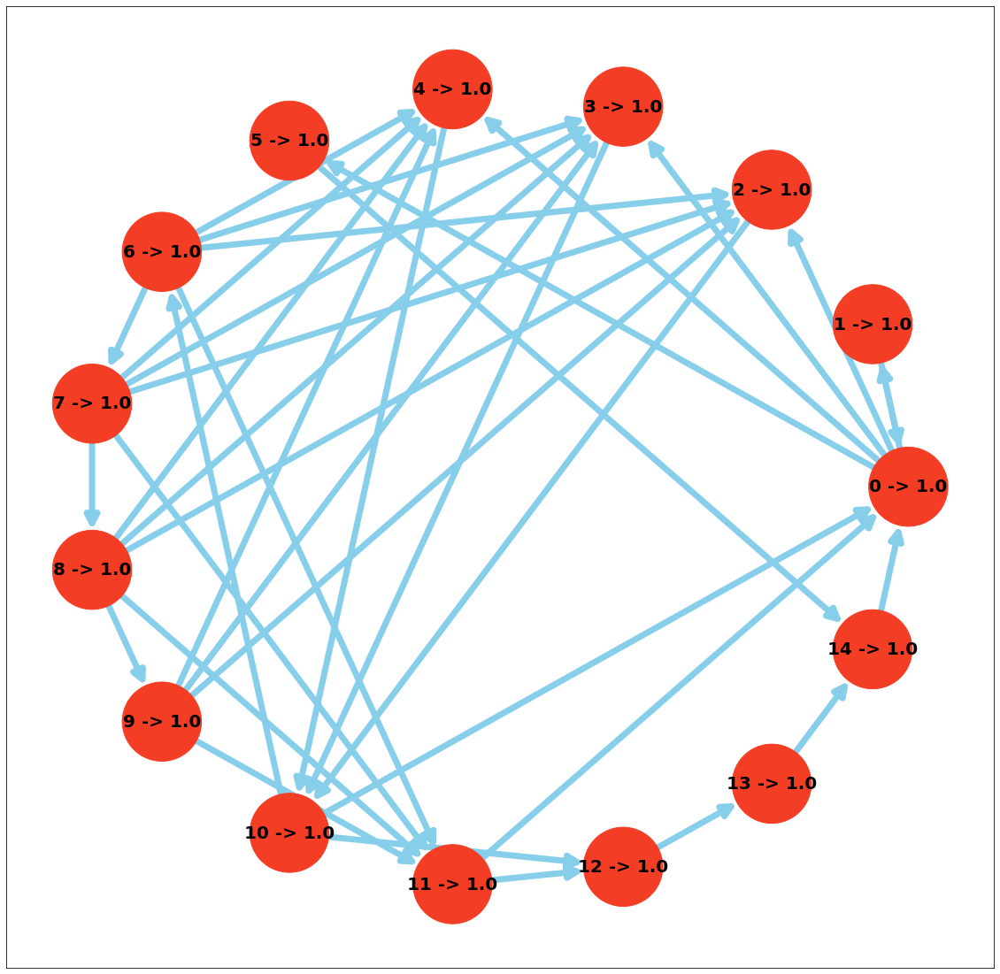

In [5]:
d = 0.85
A, size = make_adjacency_matrix("graph1.txt")
#r = np.ones((size, 1))# / size
B = d * A
result = search_eigenvector_power_method(B)
draw_page_rank (A, result)

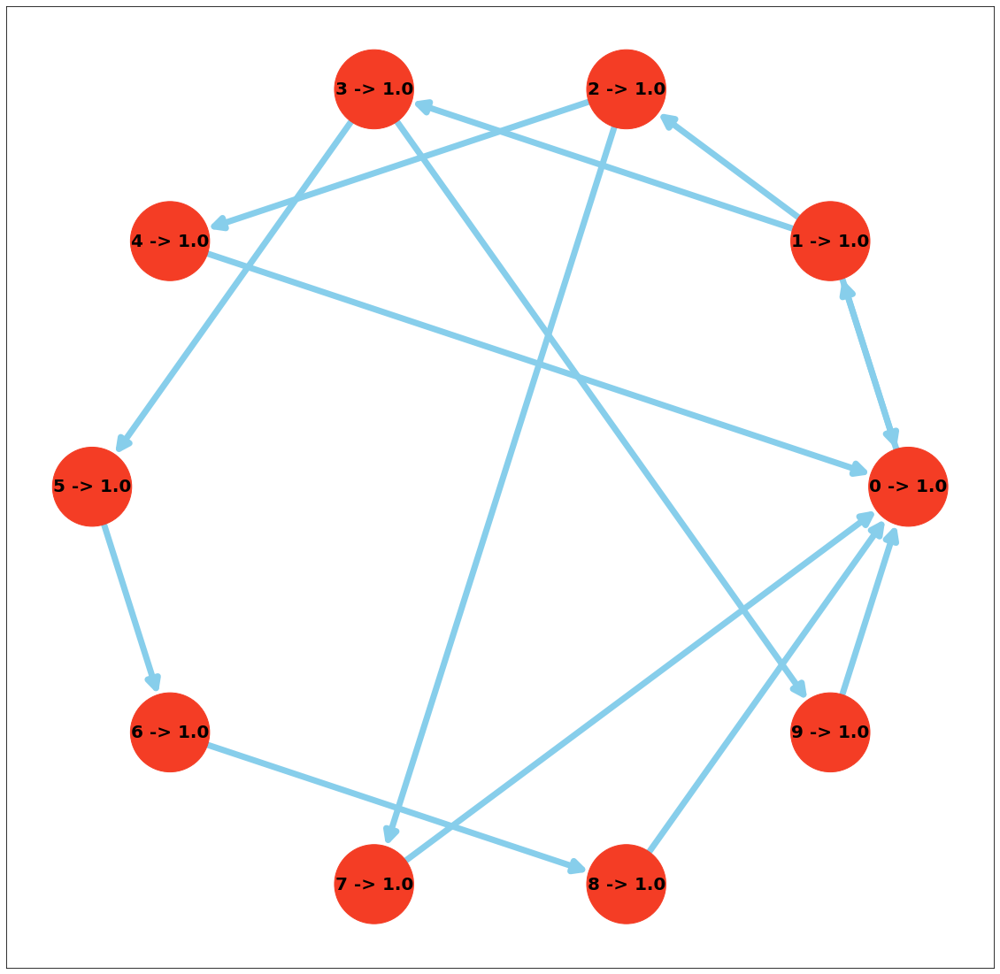

In [6]:
d = 0.85
A, size = make_adjacency_matrix("graph2.txt")
r = np.ones((size, 1))# / size
B = d * A
result = search_eigenvector_power_method(B, r.copy())
draw_page_rank (A, result)

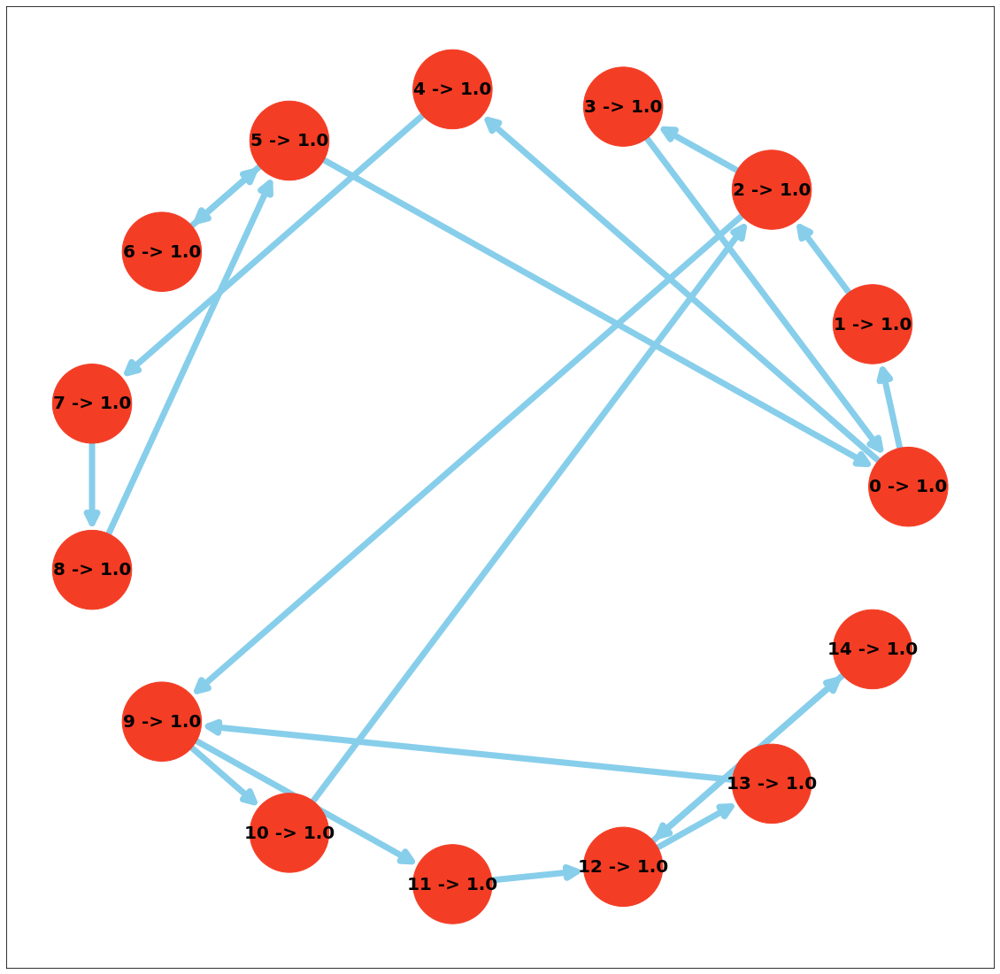

In [7]:
d = 0.85
A, size = make_adjacency_matrix("graph4.txt")
r = np.ones((size, 1))# / size
B = d * A
result = search_eigenvector_power_method(B, r.copy())
draw_page_rank (A, result)

## Page Rank

### Implementacja

Poszukiwanie wektora własnego zgodnie z algorytmem przedstawionym w artykule o page rank.

In [8]:
def search_eigenvector (A, e, r = [], epsilon = 10**-10):
    if len (r) == 0:
        r = np.ones((len(A), 1))
    for k in range (100000):
        new = A @ r
        d = np.sum(np.abs(r)) - np.sum(np.abs(new))
        new = new + d * e
        delta = np.sum(np.abs(new - r))
        r = new
        if delta <= epsilon:
            break
    else:
        print ("Za mała liczba iteracji, nie osiągnięsto dokładności epsilon")
    return r / np.sum(np.abs(r))

Algorytm wczytuje graf z pliku i oblicza page rank dla najprostszego przypadku gdy d=0.85 oraz wektor e to wektor jedynek podzielony przez rozmiar.

In [9]:
def page_rank (d = 0.85, filepath = "graph.txt", draw = False):
    A, size = make_adjacency_matrix(filepath, not draw)
    if draw:
        e = np.ones(size) / size
        e = e.reshape(-1, 1)
        B = d * A + (1 - d) * np.float32(np.outer (e, np.ones(size)))
        result = search_eigenvector(B, e)
        draw_page_rank (A, result)
    else:
        e = np.ones(size, dtype=np.float32) / size
        e = e.reshape(-1, 1)
        B = d * A + (1 - d) * (np.outer (e, np.ones(size, np.float32)))
        result = search_eigenvector(B, e)
    return result

### Testy z wizualizacją

Testy dla kilku mniejszych grafów z wizualizacją.

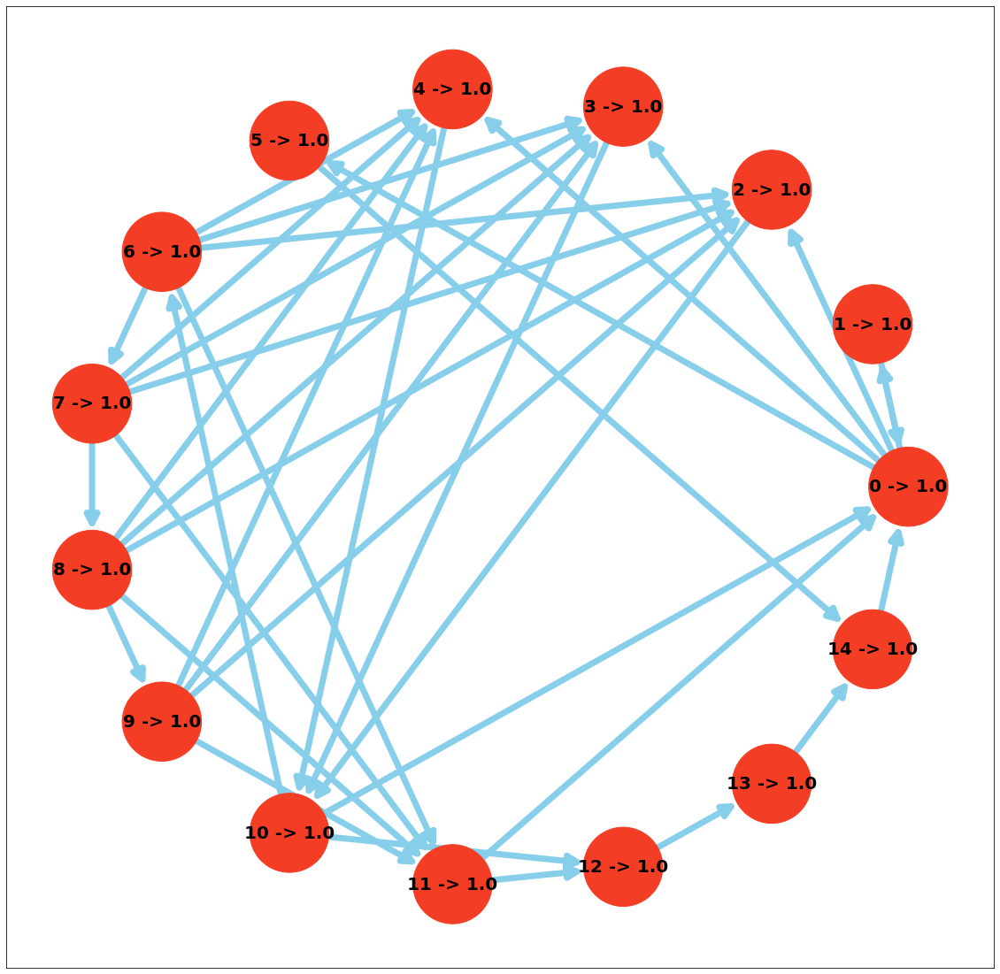

In [10]:
res = page_rank(filepath = "graph1.txt", draw = True)

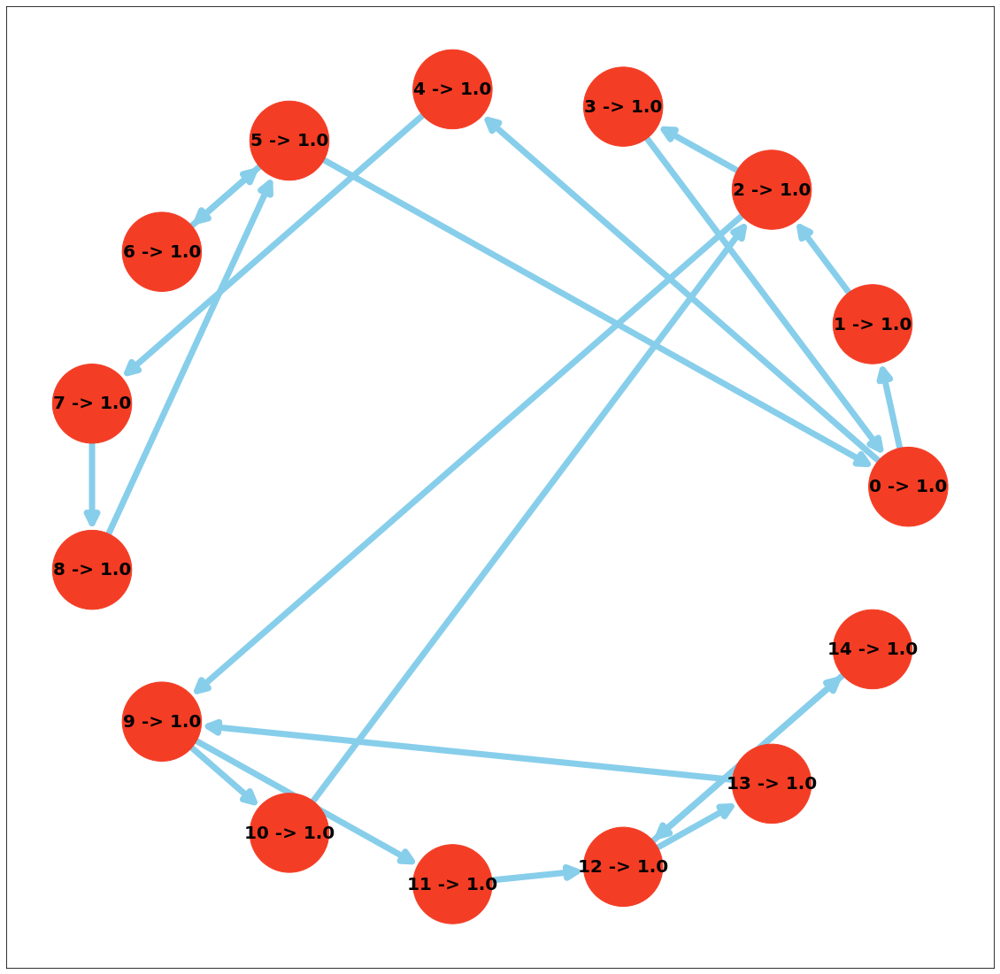

In [11]:
res = page_rank(filepath = "graph4.txt", draw = True)

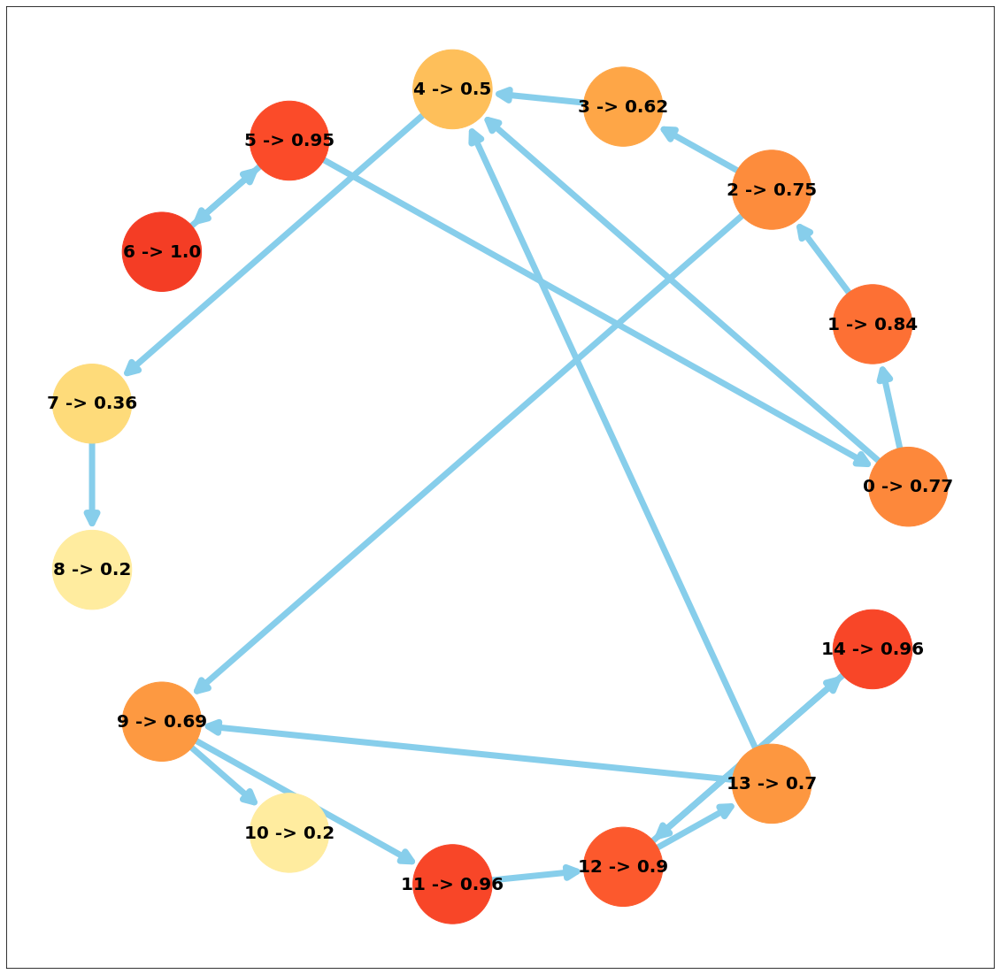

In [12]:
res = page_rank(filepath = "graph5.txt", draw = True)

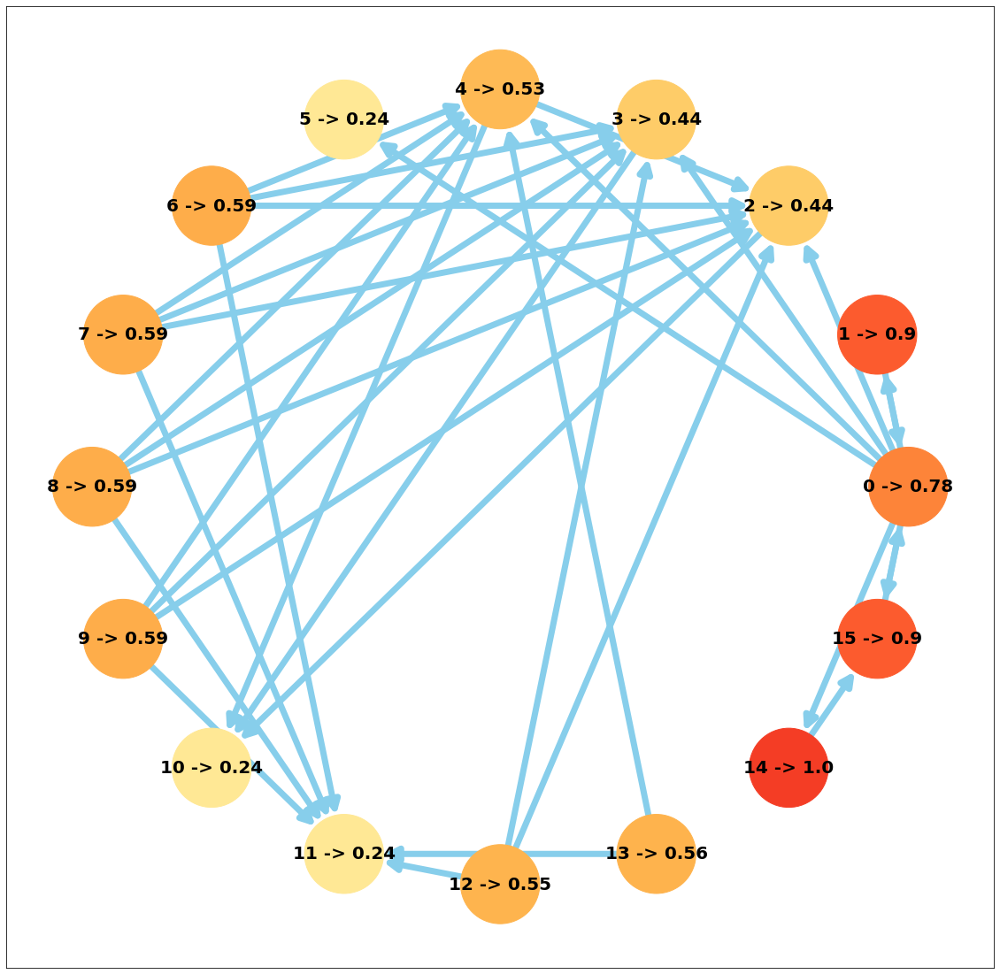

In [13]:
res = page_rank(filepath = "graph3.txt", draw = True)

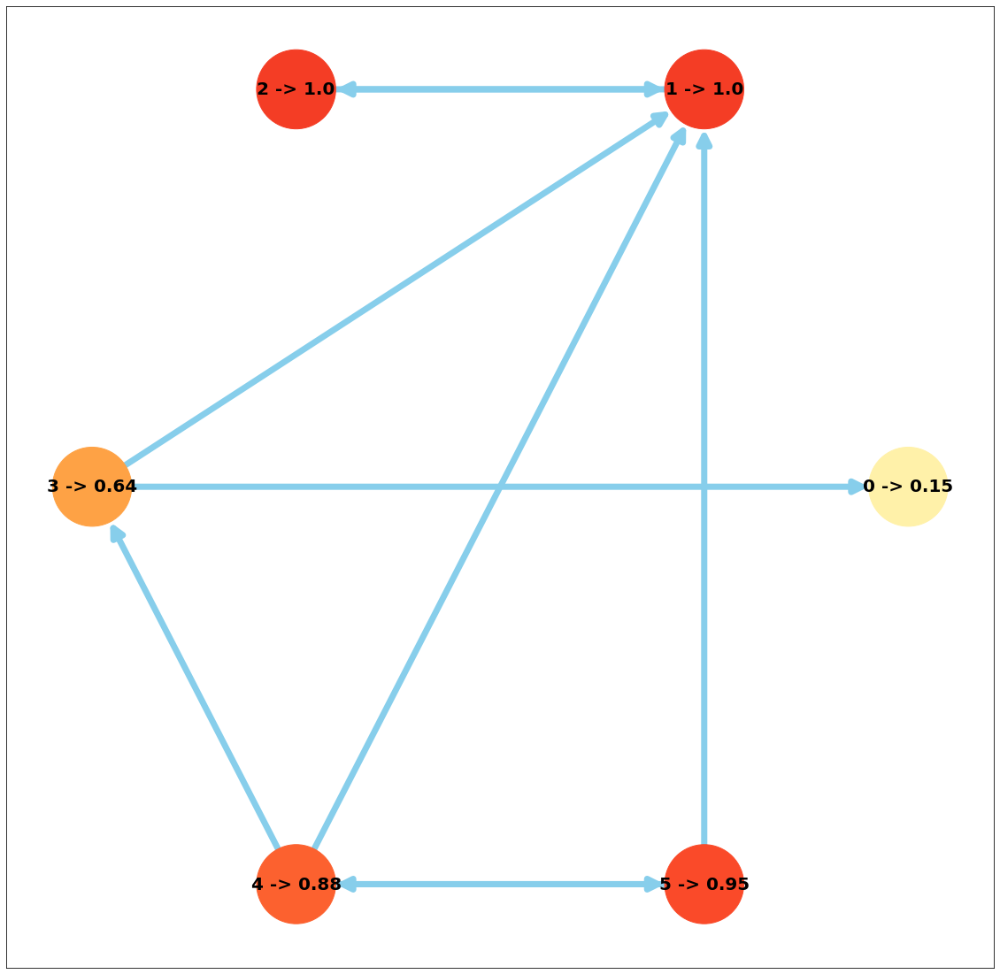

In [14]:
res = page_rank(filepath = "wiki.txt", draw = True)

### Testy parametrów

Dla trzech różnych grafów zestaw testów dla kilku wartości d i trzech typów wektora e ("simple" -> wektor jedynek podzielony przez rozmiar, "arange" -> rezultat funkcji arange znormalizowany przez normę L1, "random" -> losowe wartości znormalizowane normą L1).

Wektor e: simple Parametr d: 0.9


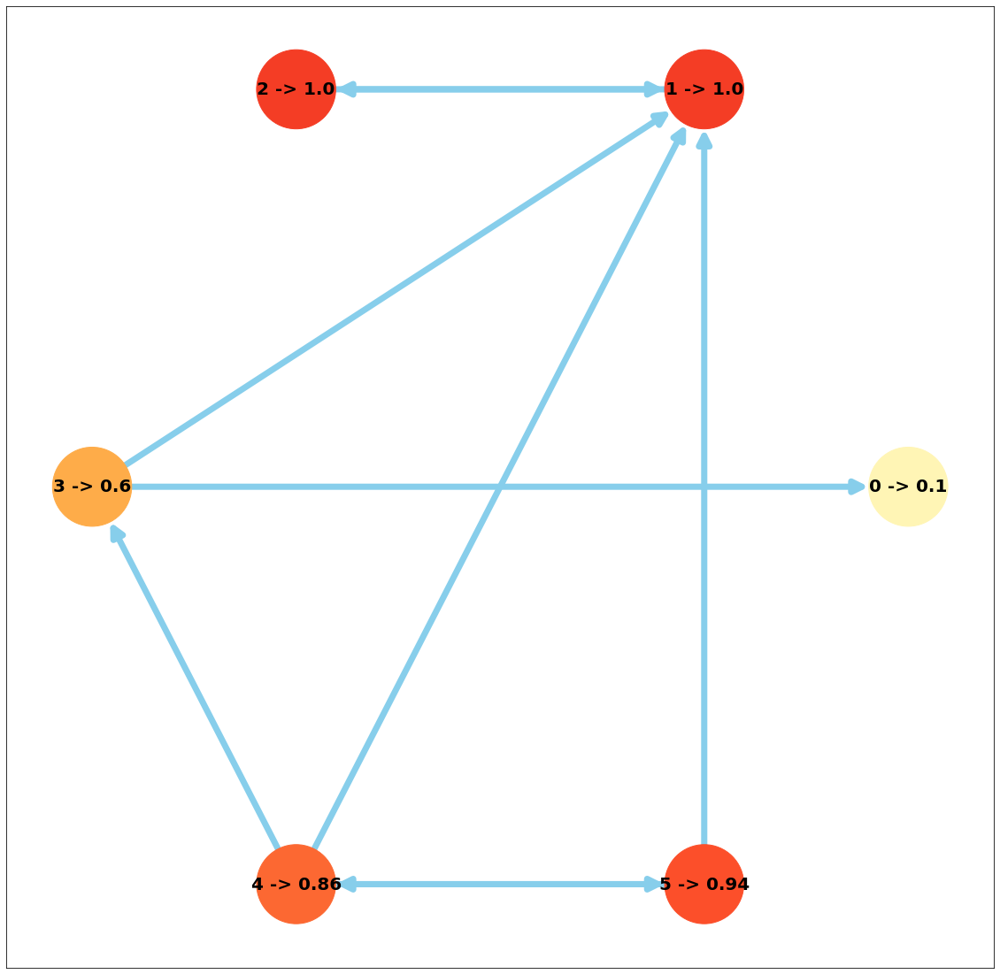

Wektor e: simple Parametr d: 0.85


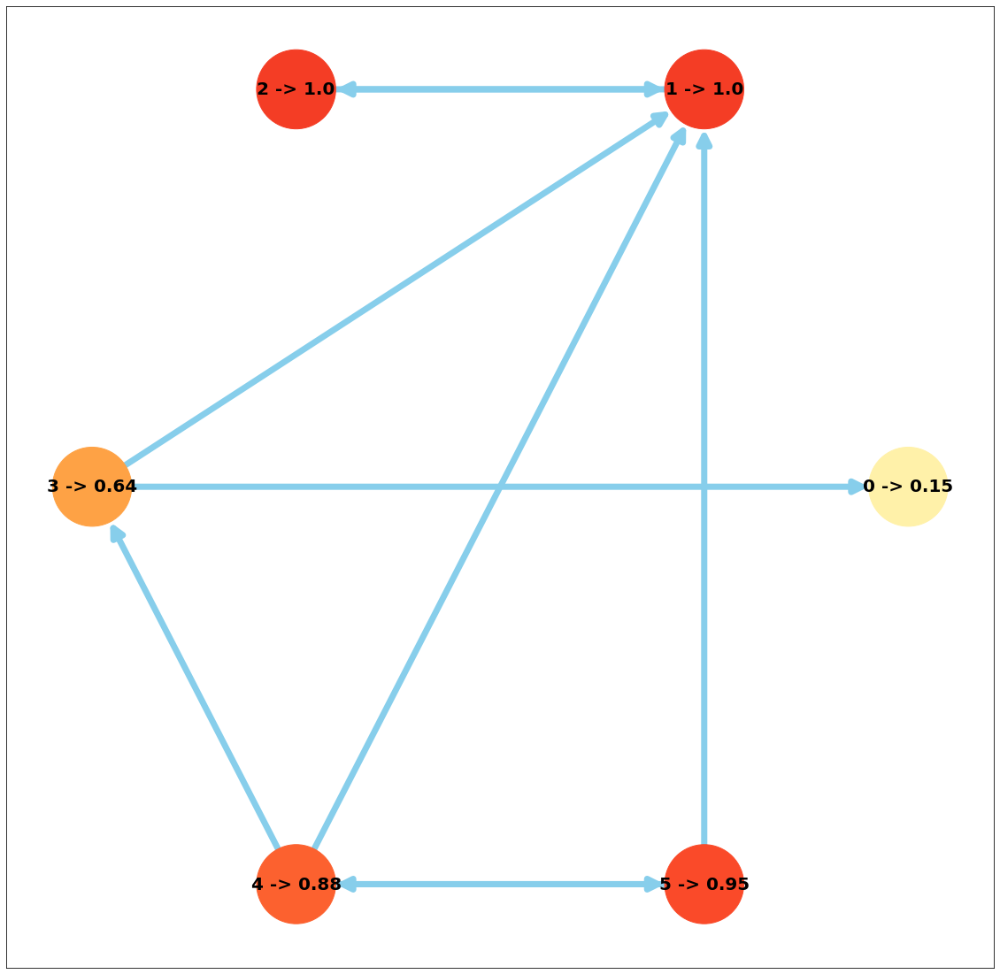

Wektor e: simple Parametr d: 0.75


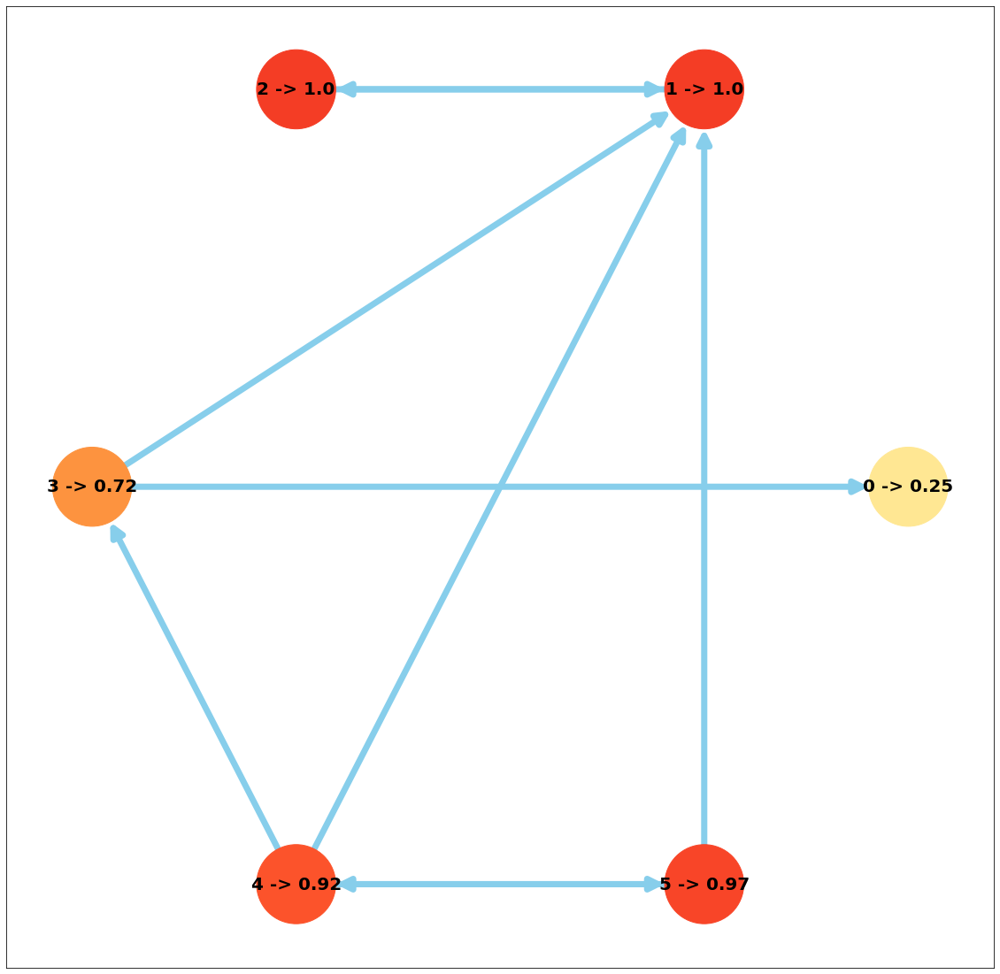

Wektor e: simple Parametr d: 0.6


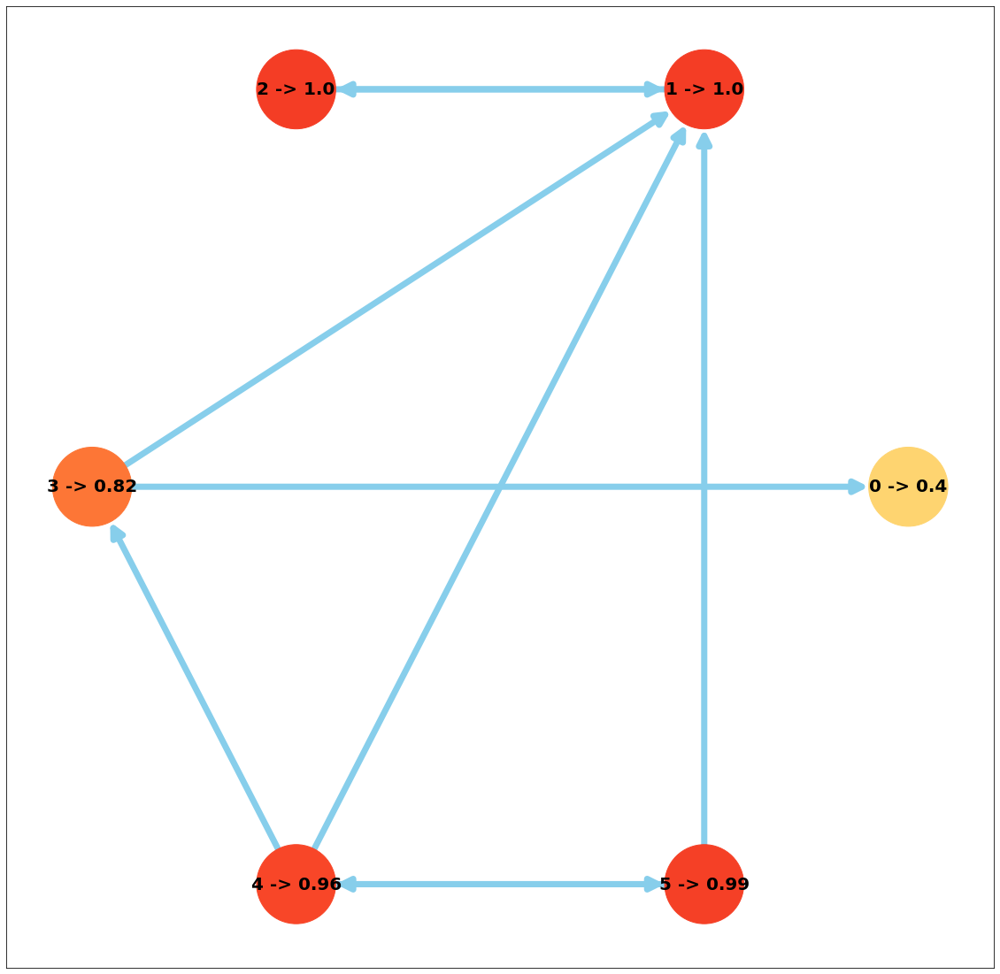

Wektor e: simple Parametr d: 0.5


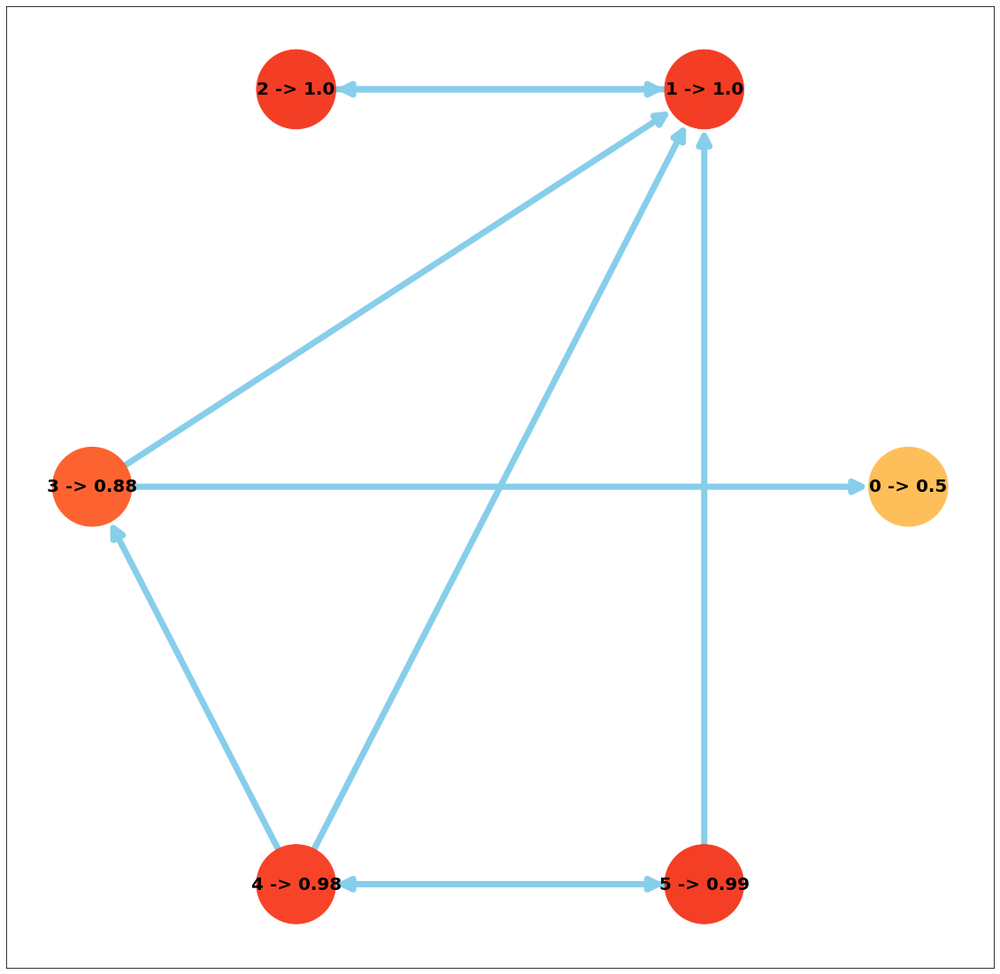

Wektor e: arange Parametr d: 0.9


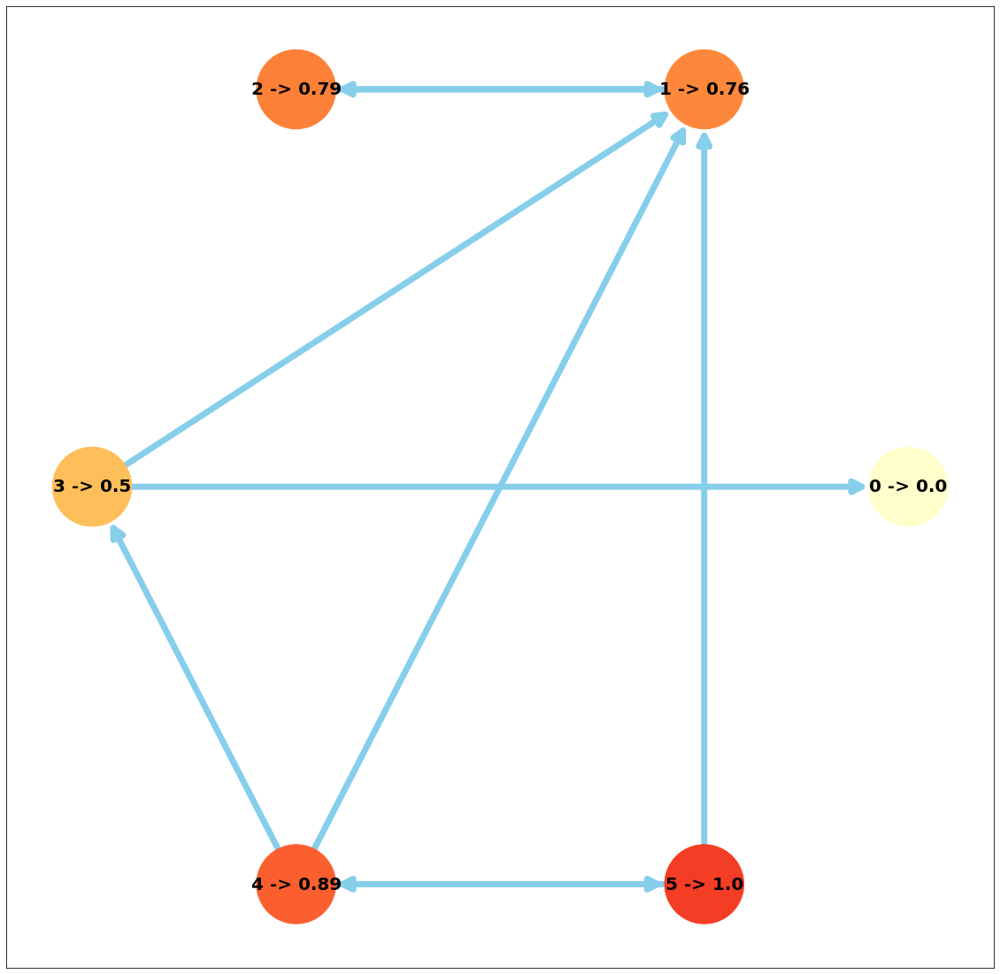

Wektor e: arange Parametr d: 0.85


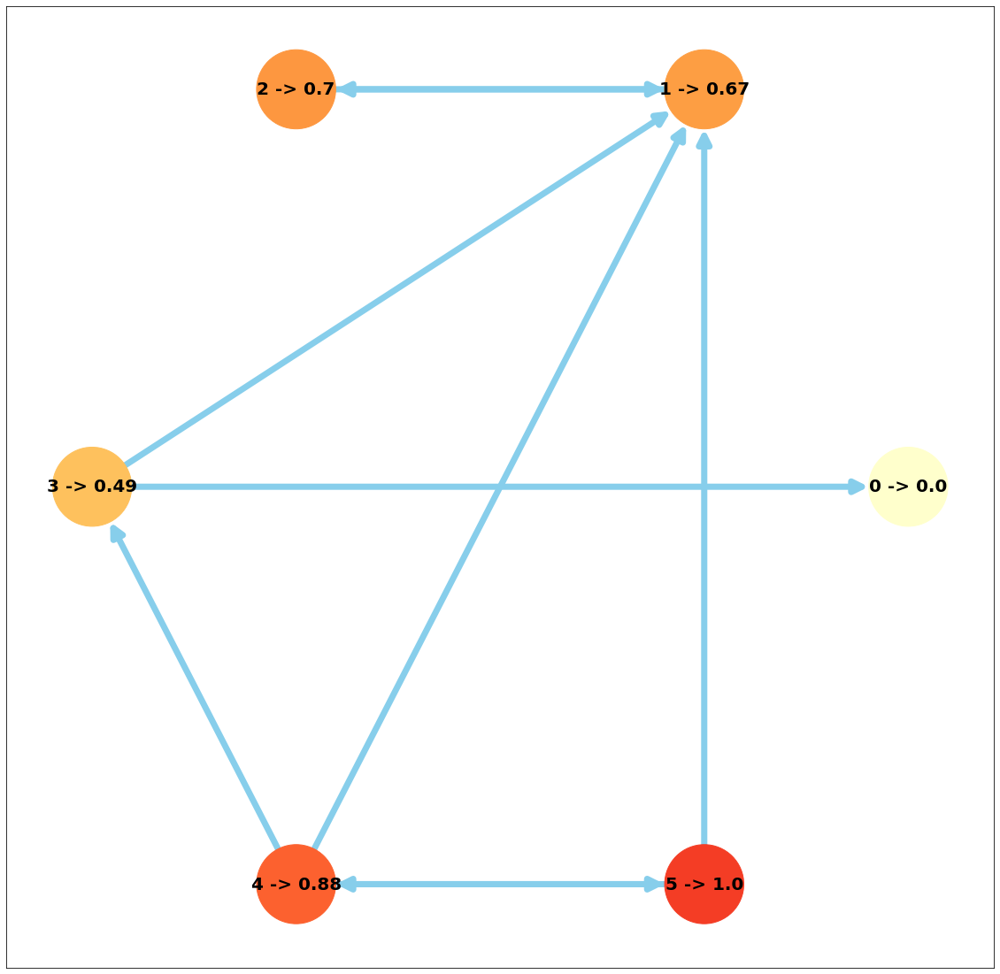

Wektor e: arange Parametr d: 0.75


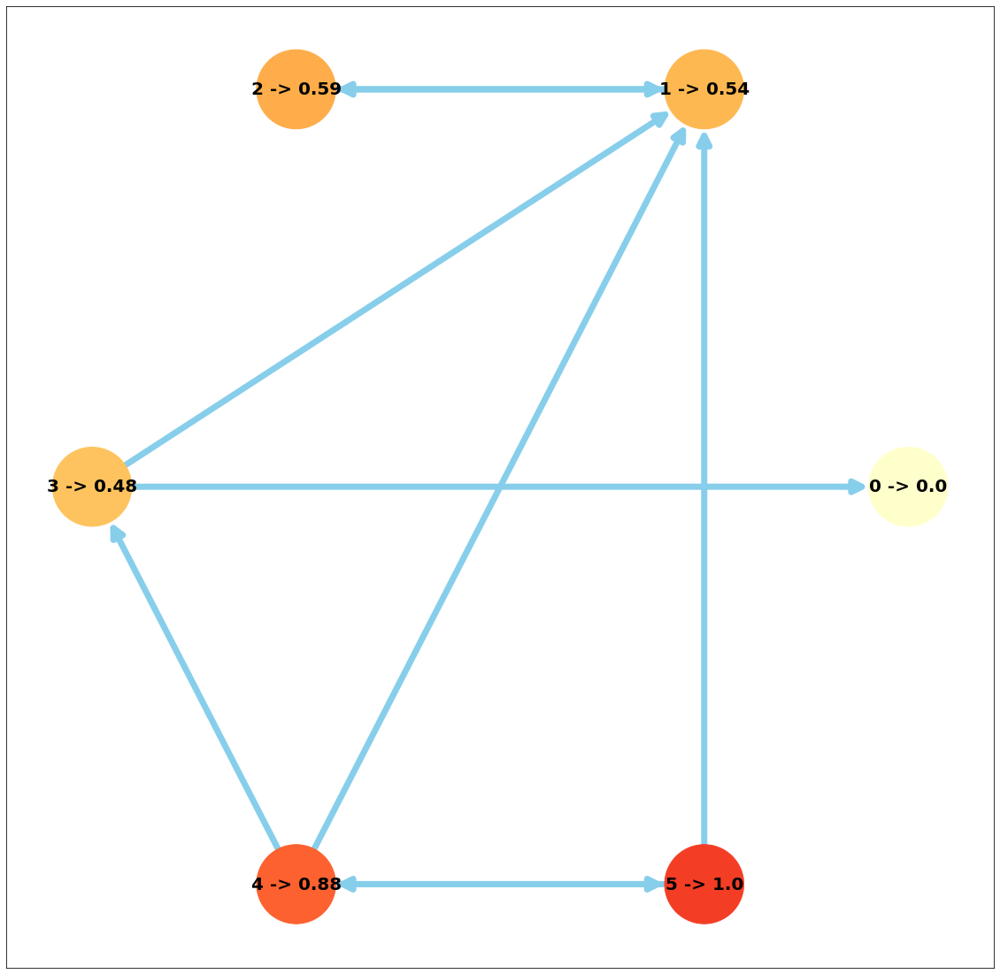

Wektor e: arange Parametr d: 0.6


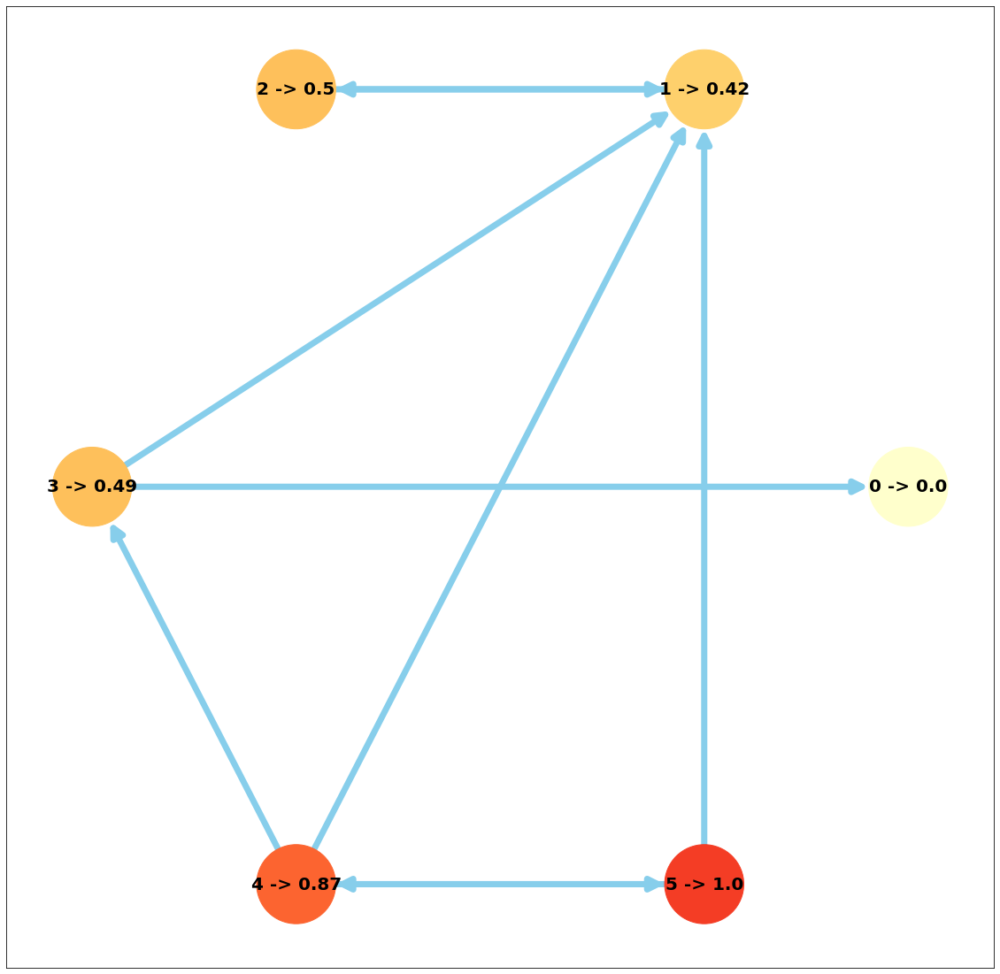

Wektor e: arange Parametr d: 0.5


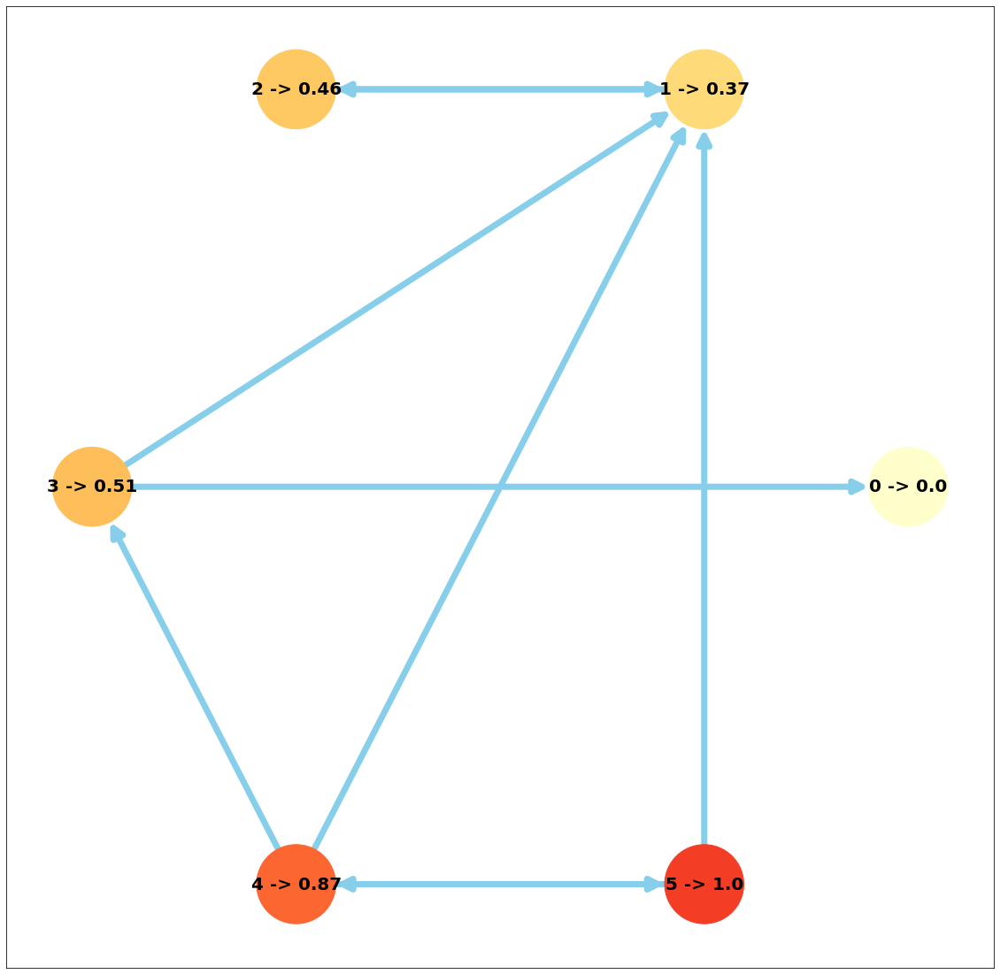

Wektor e: random Parametr d: 0.9


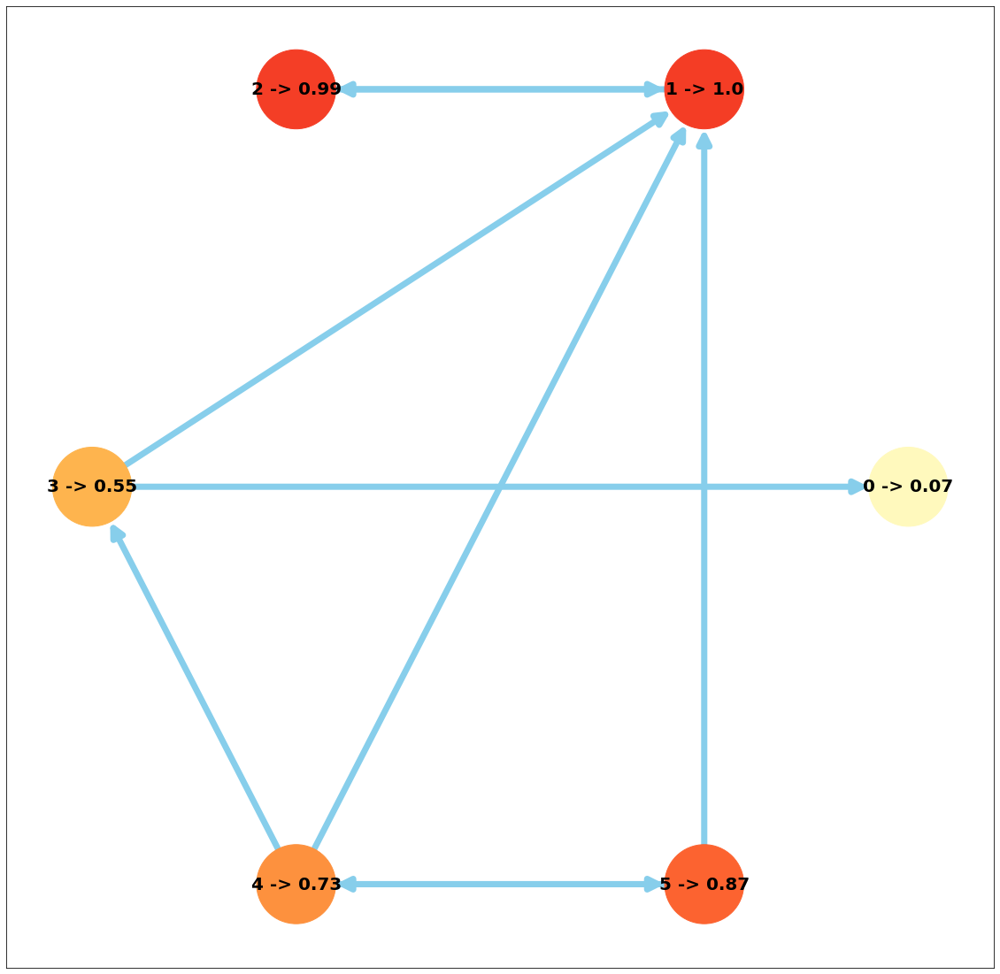

Wektor e: random Parametr d: 0.85


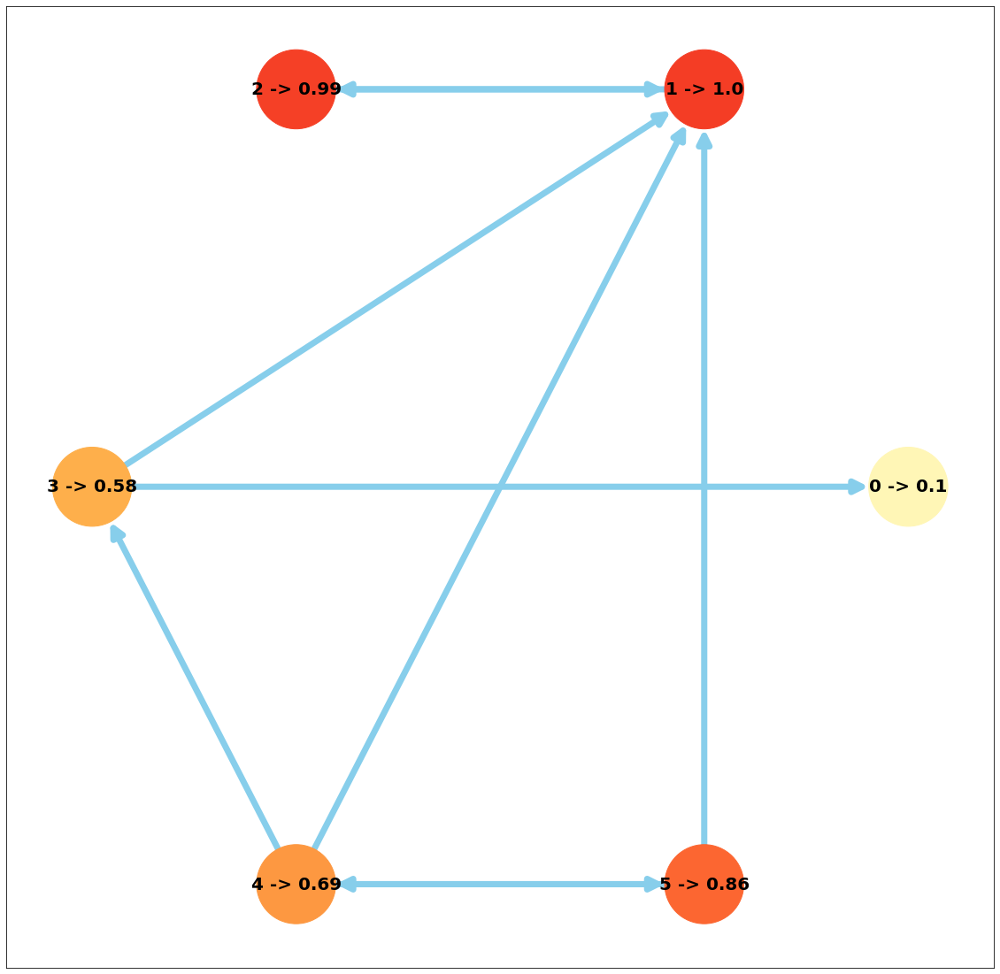

Wektor e: random Parametr d: 0.75


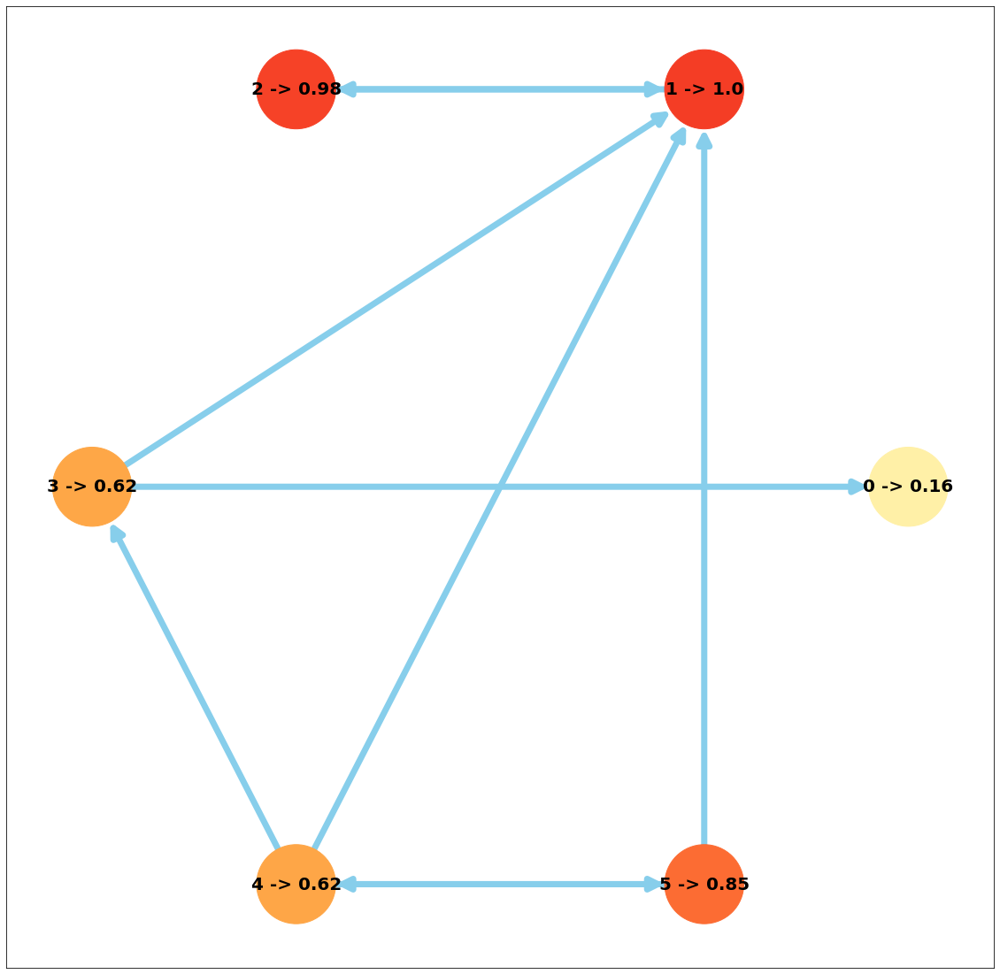

Wektor e: random Parametr d: 0.6


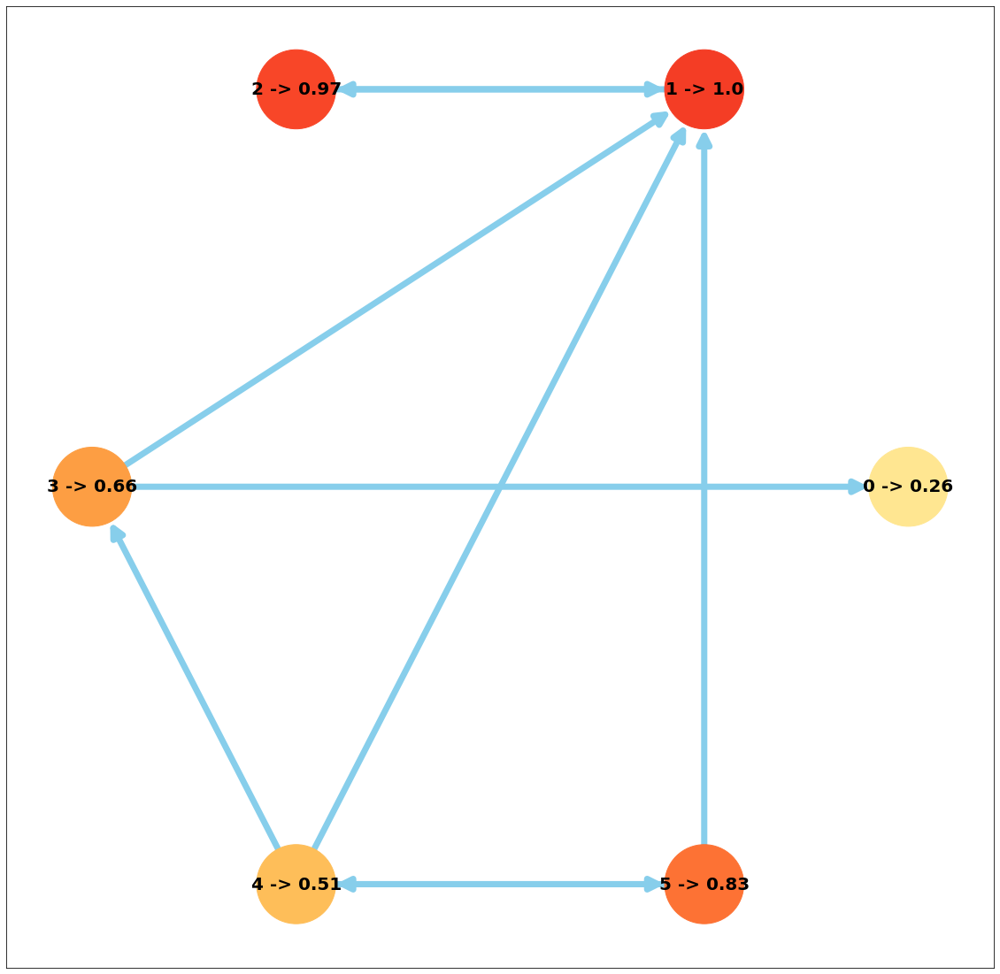

Wektor e: random Parametr d: 0.5


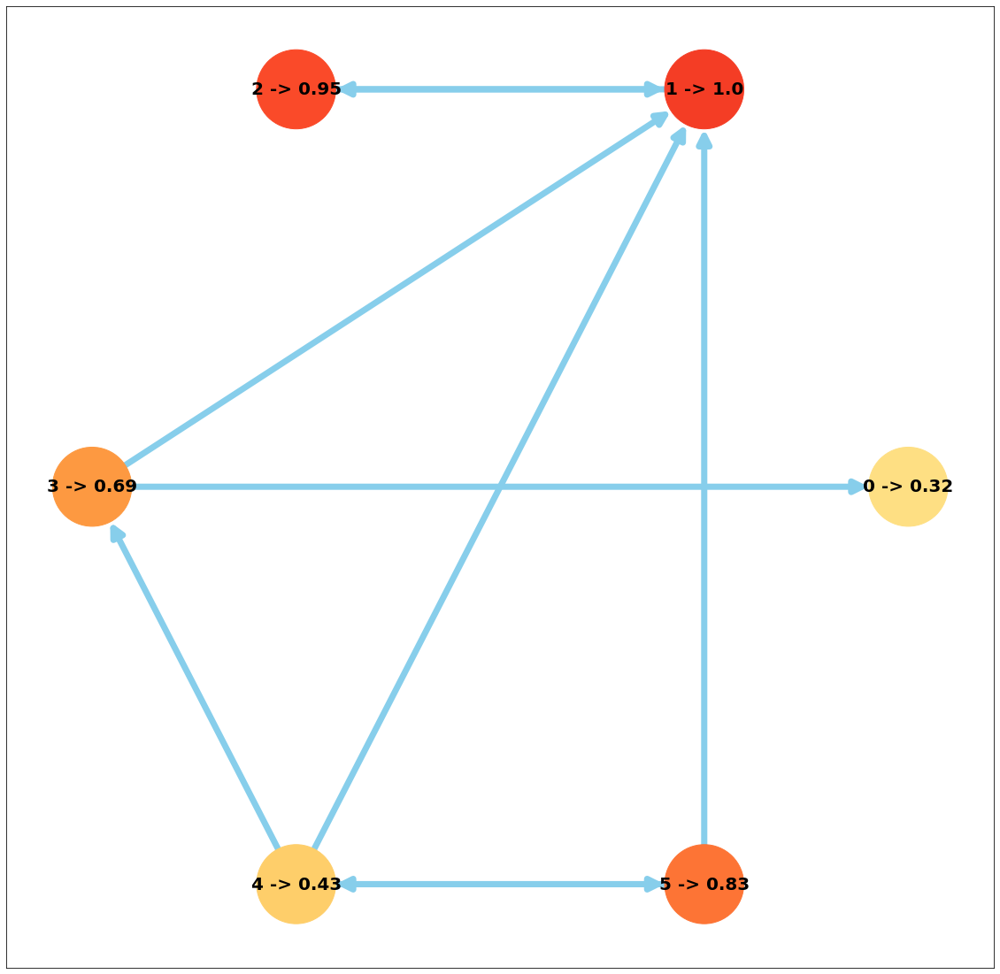

In [15]:
d_arr = [0.9, 0.85, 0.75, 0.6, 0.5]
e_arr = ["simple", "arange", "random"]
filepath = "wiki.txt"
A, size = make_adjacency_matrix(filepath)

for e_type in e_arr:
    if e_type == "simple":
        e = np.ones(size) / size
    elif e_type == "arange":
        e = np.arange(size)
        e = e / np.sum(e)
    elif e_type == "random":
        e = np.random.uniform(0, 1, size)
        e = e / np.sum(e)
    e = e.reshape(-1, 1)
    for d in d_arr:
        print ("Wektor e:", e_type, "Parametr d: " + str(d))
        B = d * A + (1 - d) * np.outer (e, np.ones(size))
        result = search_eigenvector(B, e)
        draw_page_rank (A, result)

Wektor e: simple Parametr d: 0.9


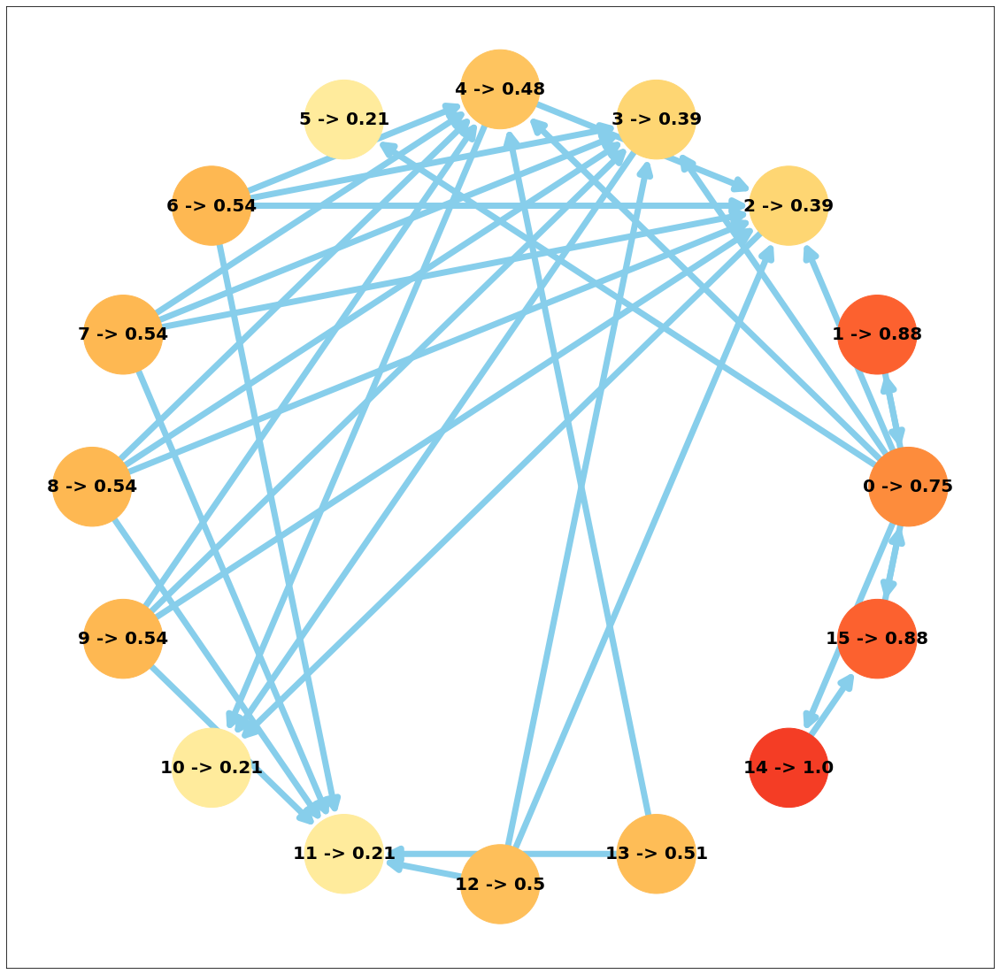

Wektor e: simple Parametr d: 0.85


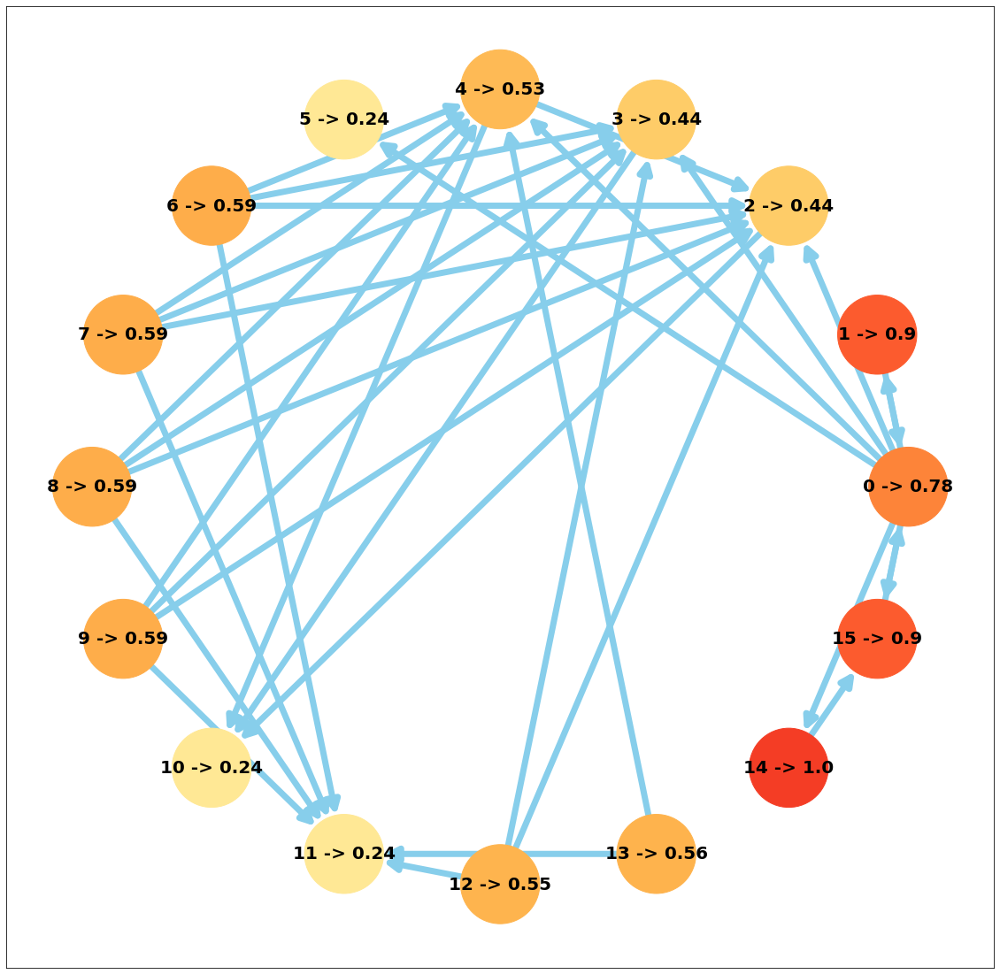

Wektor e: simple Parametr d: 0.75


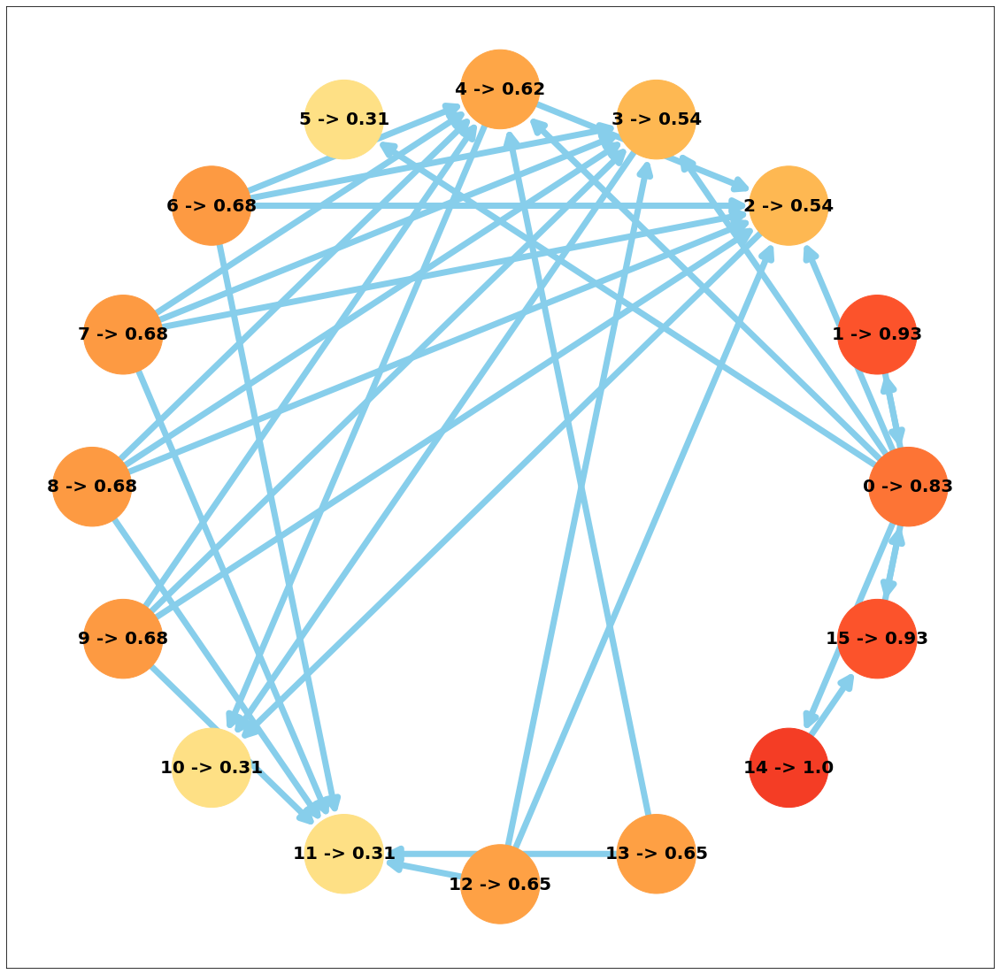

Wektor e: simple Parametr d: 0.6


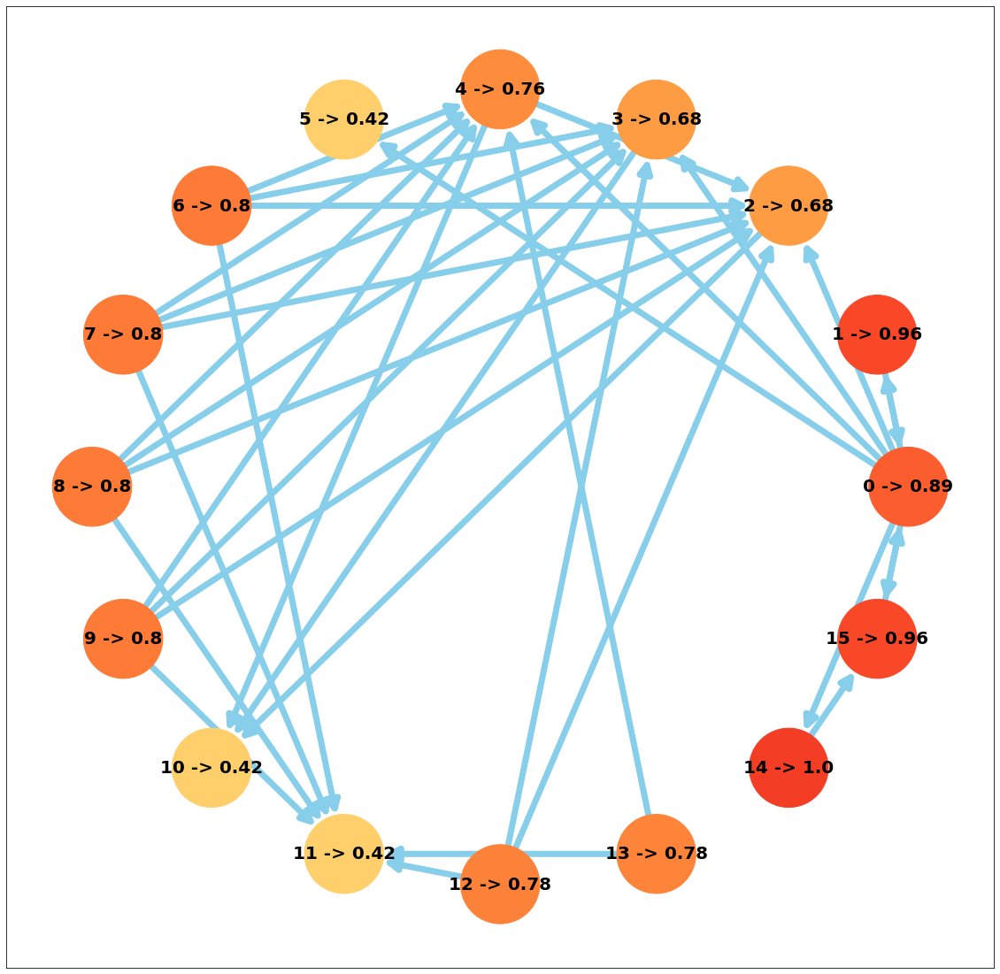

Wektor e: simple Parametr d: 0.5


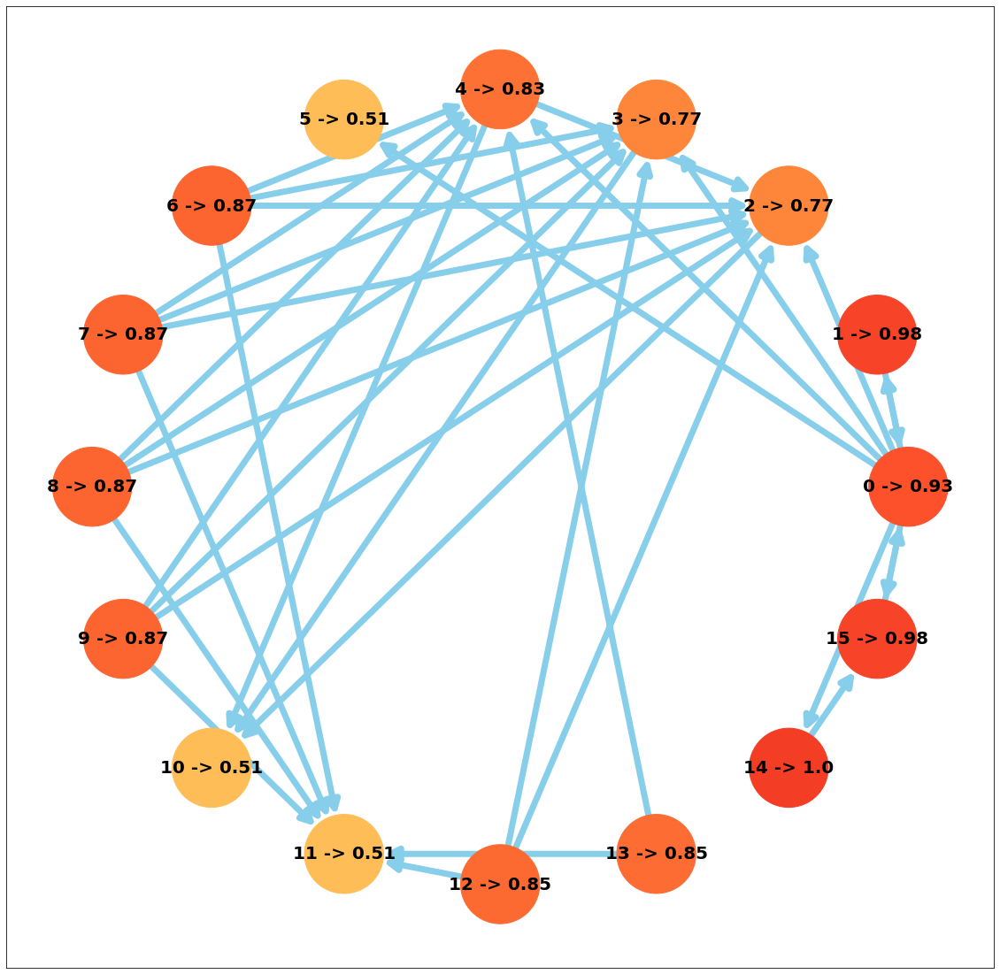

Wektor e: arange Parametr d: 0.9


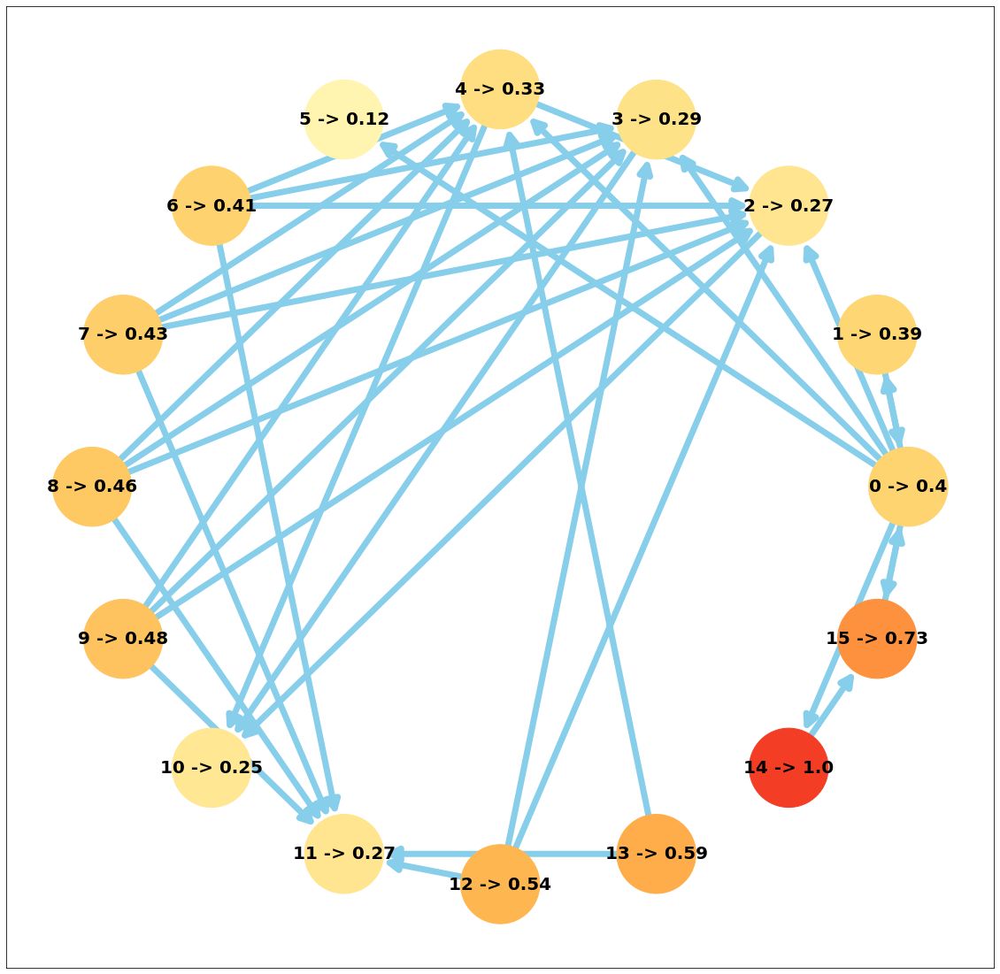

Wektor e: arange Parametr d: 0.85


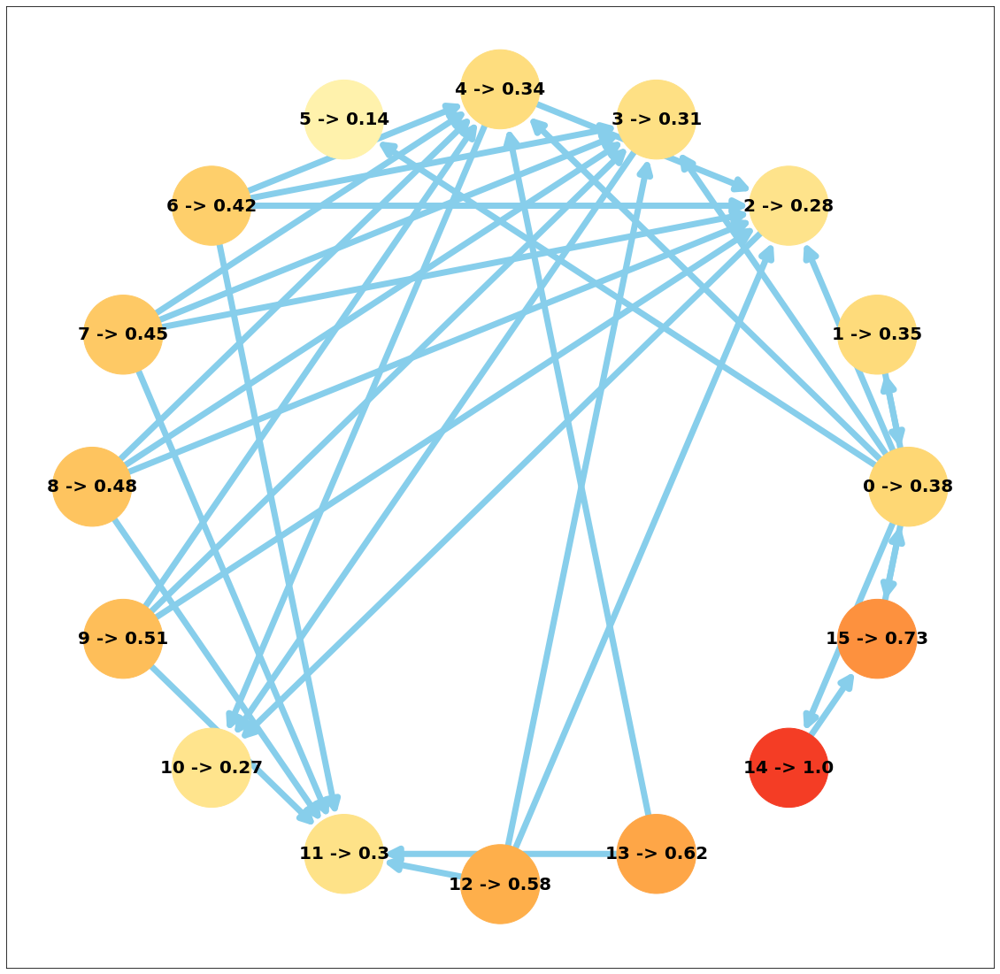

Wektor e: arange Parametr d: 0.75


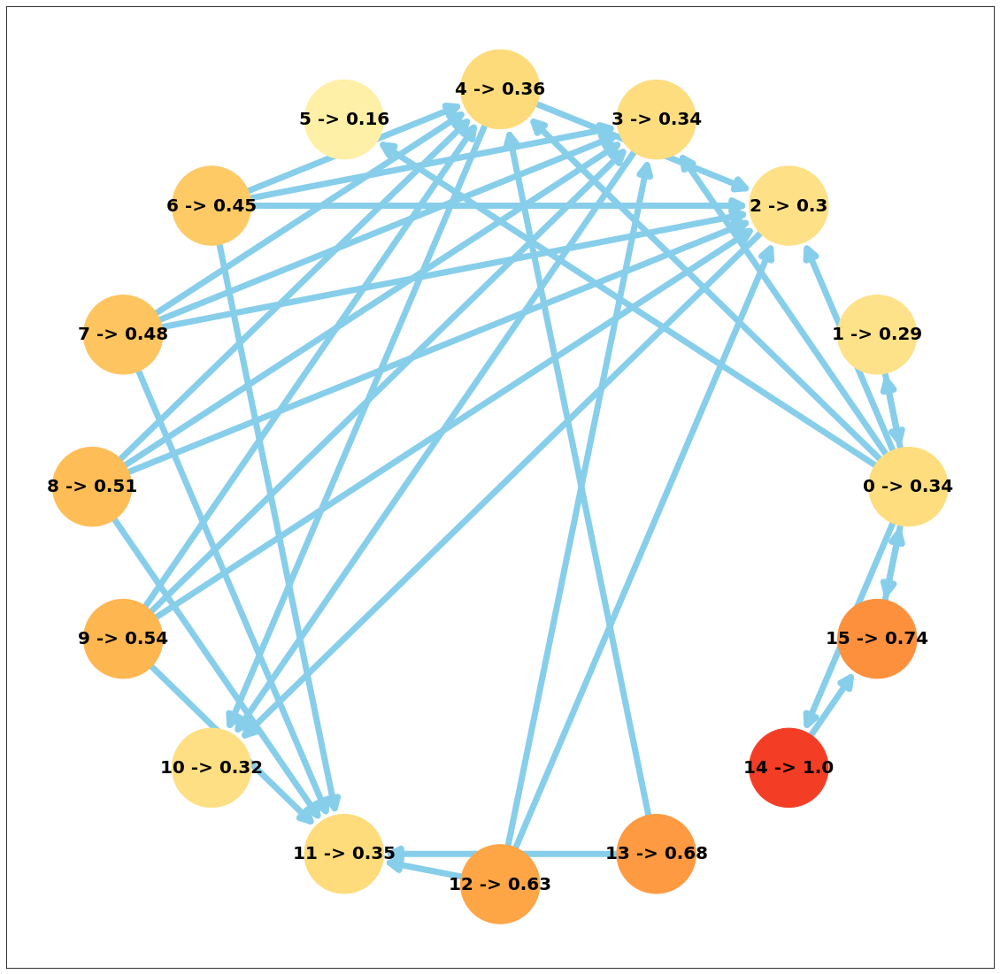

Wektor e: arange Parametr d: 0.6


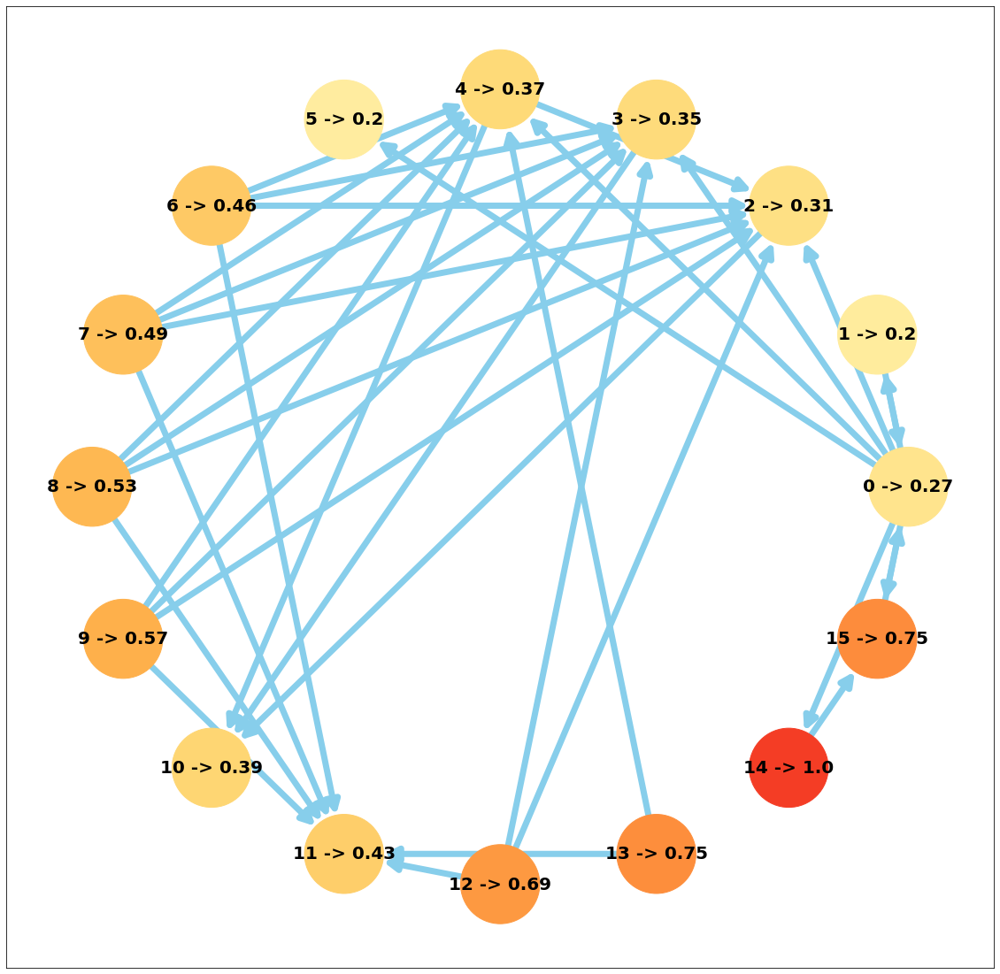

Wektor e: arange Parametr d: 0.5


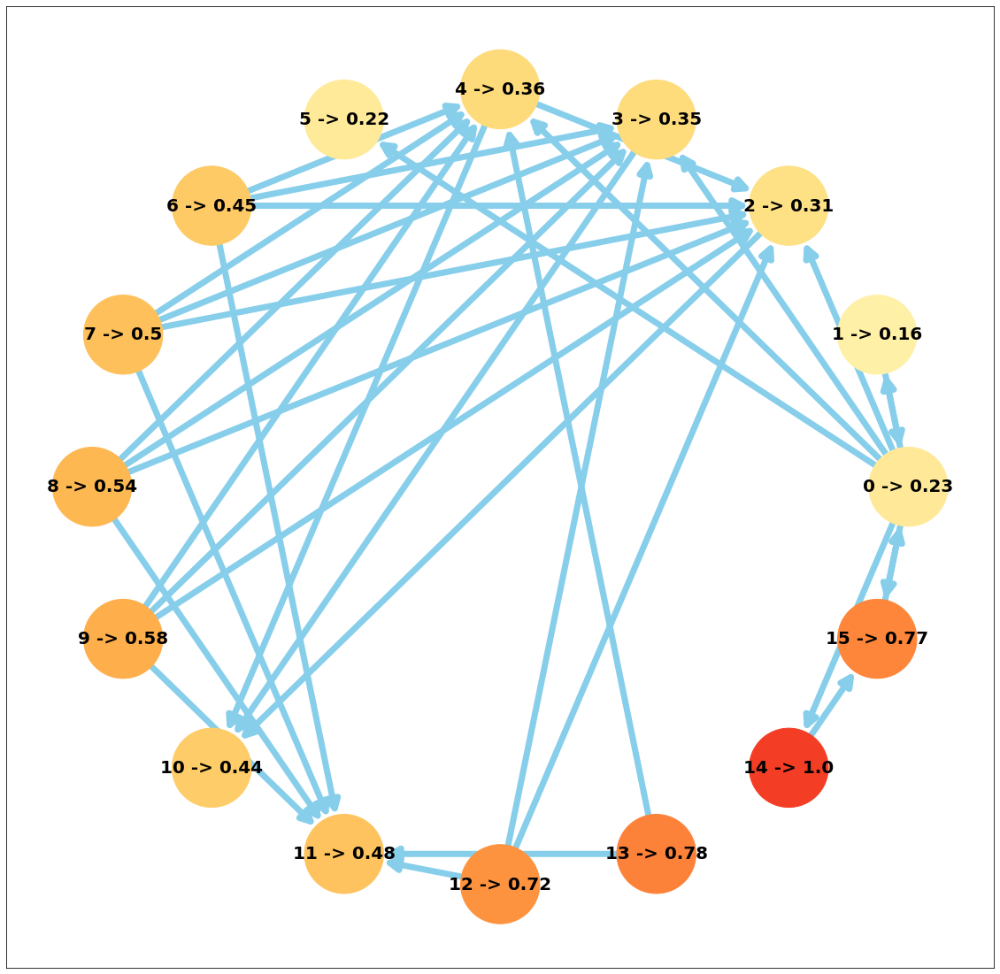

Wektor e: random Parametr d: 0.9


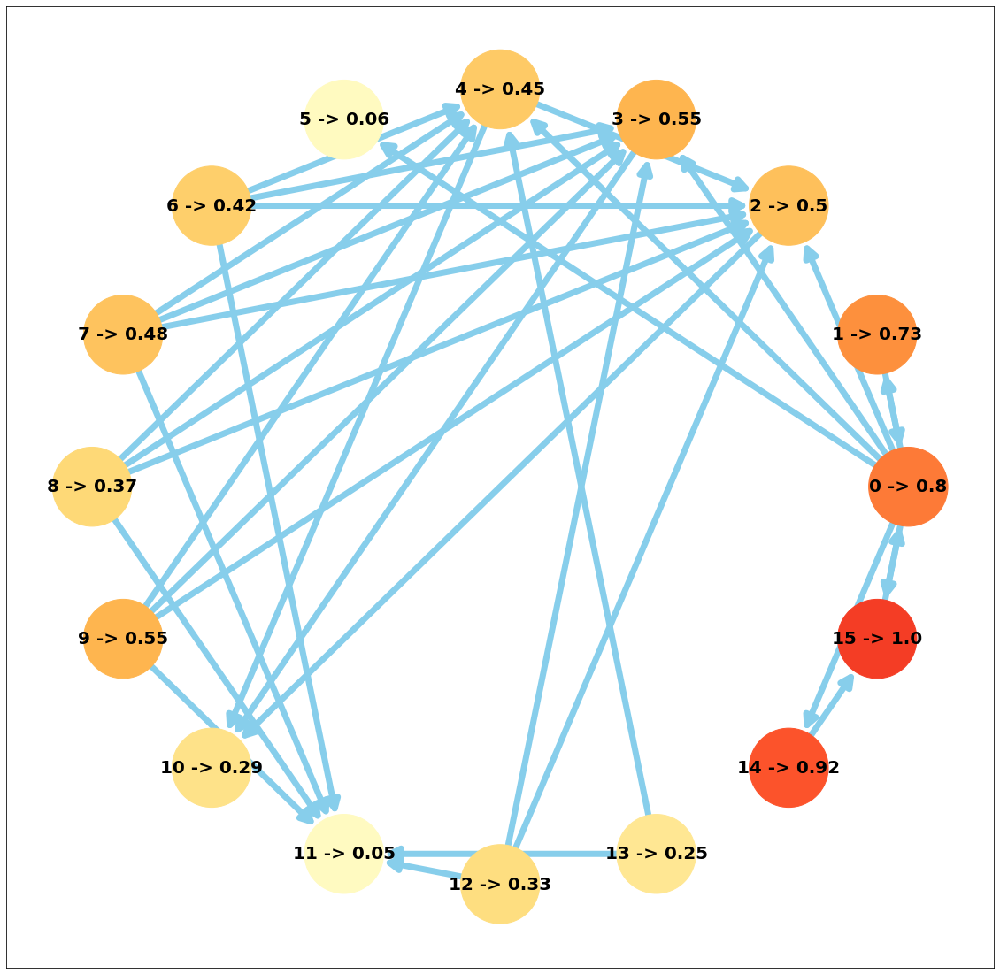

Wektor e: random Parametr d: 0.85


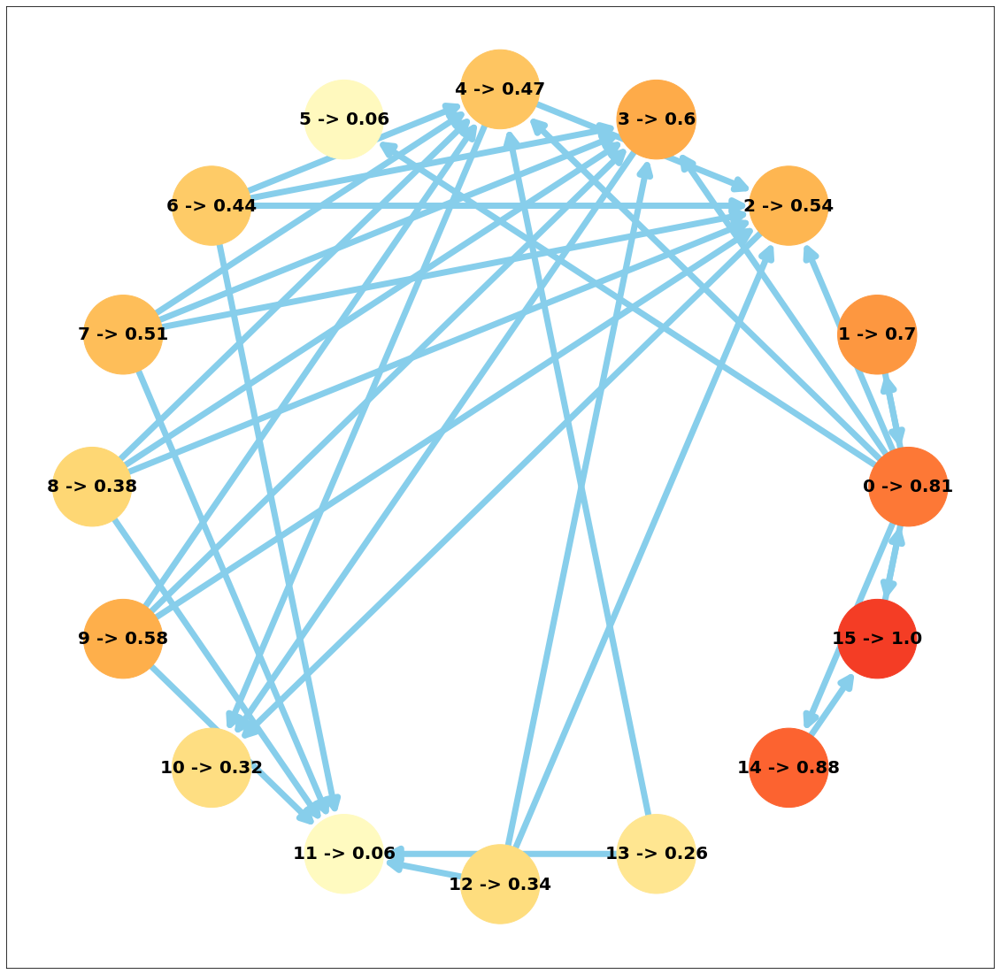

Wektor e: random Parametr d: 0.75


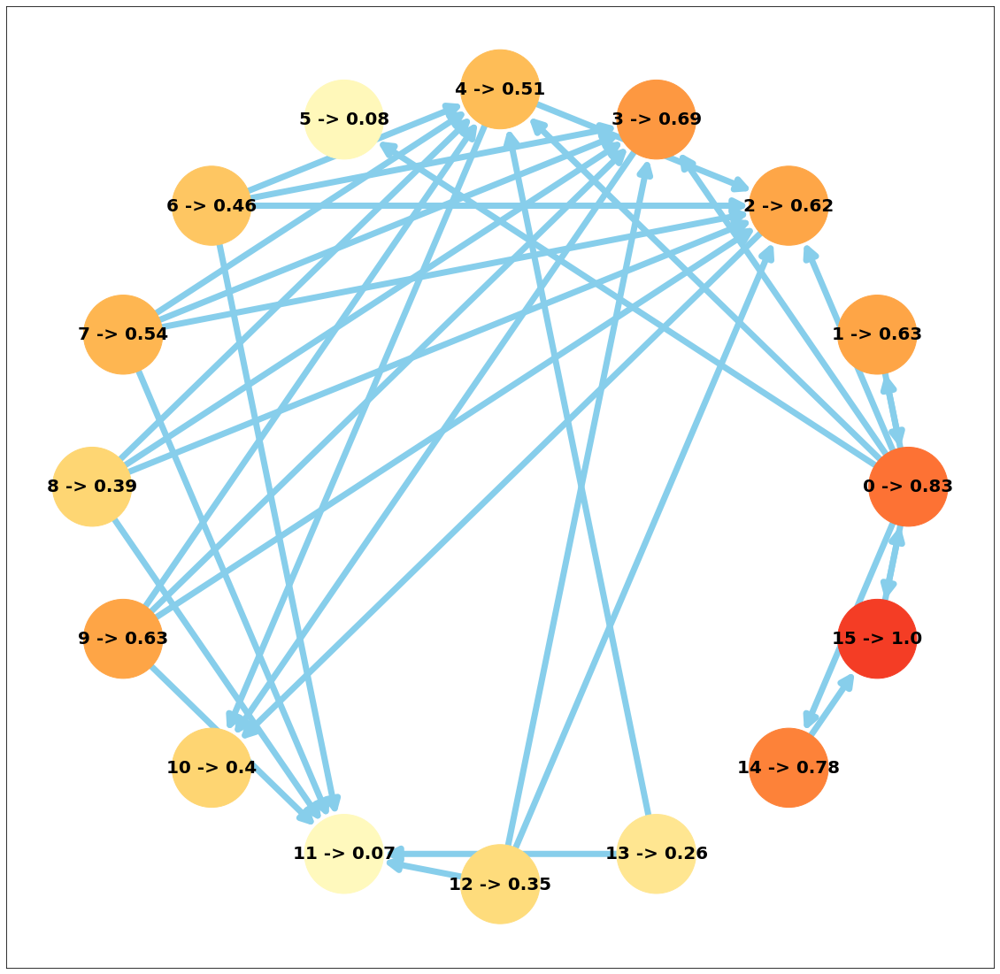

Wektor e: random Parametr d: 0.6


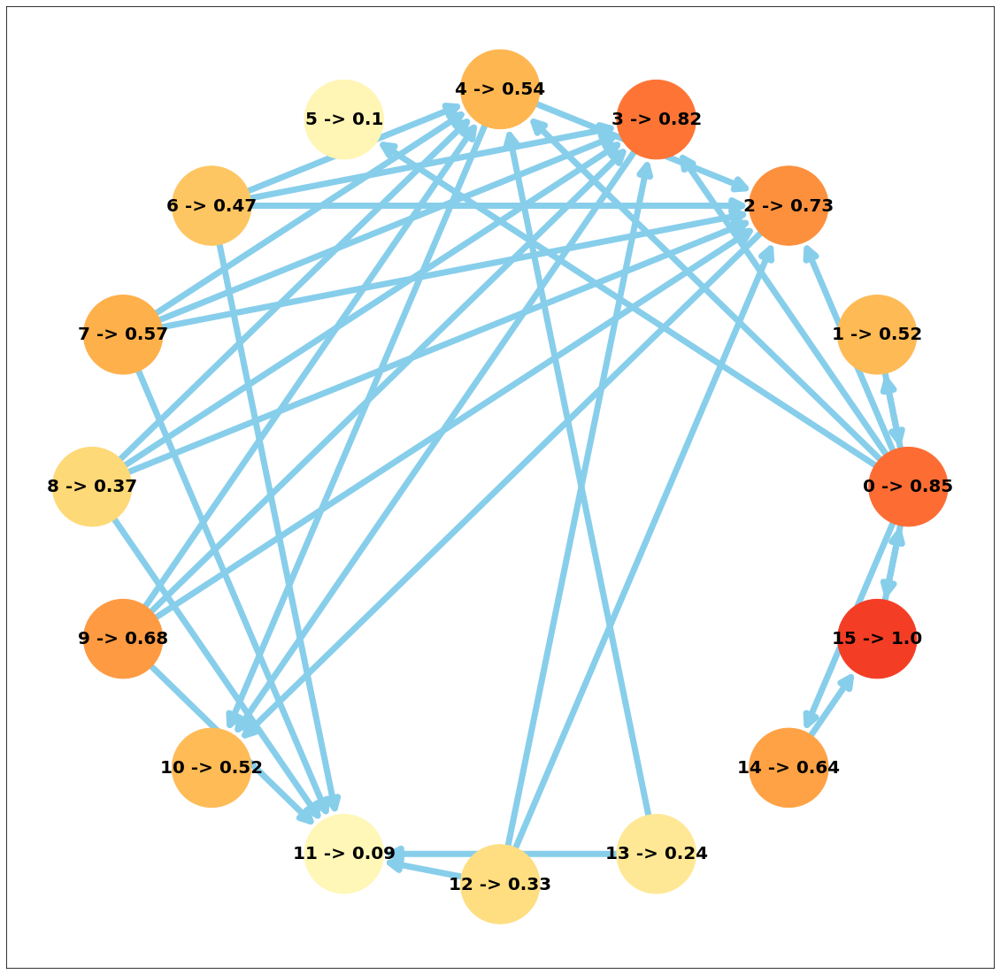

Wektor e: random Parametr d: 0.5


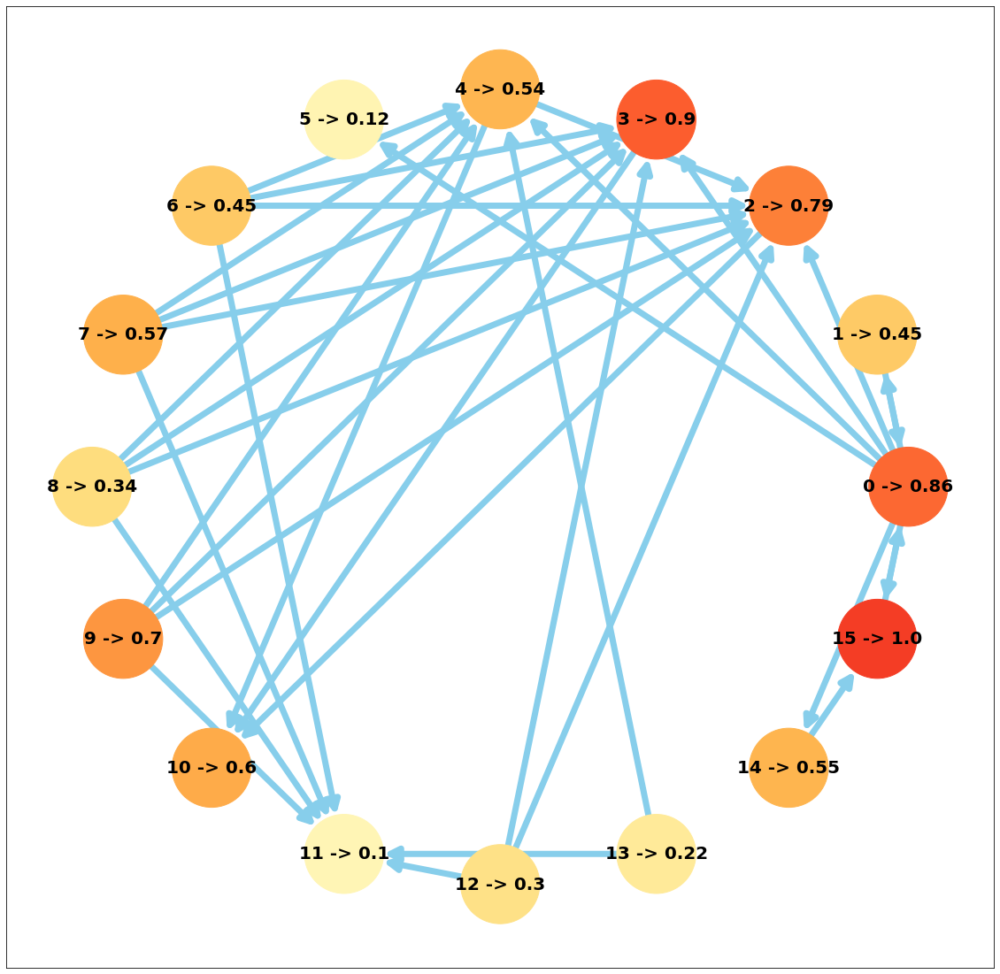

In [16]:
d_arr = [0.9, 0.85, 0.75, 0.6, 0.5]
e_arr = ["simple", "arange", "random"]
filepath = "graph3.txt"
A, size = make_adjacency_matrix(filepath)

for e_type in e_arr:
    if e_type == "simple":
        e = np.ones(size) / size
    elif e_type == "arange":
        e = np.arange(size)
        e = e / np.sum(e)
    elif e_type == "random":
        e = np.random.uniform(0, 1, size)
        e = e / np.sum(e)
    e = e.reshape(-1, 1)
    for d in d_arr:
        print ("Wektor e:", e_type, "Parametr d: " + str(d))
        B = d * A + (1 - d) * np.outer (e, np.ones(size))
        result = search_eigenvector(B, e)
        draw_page_rank (A, result)

Wektor e: simple Parametr d: 0.9


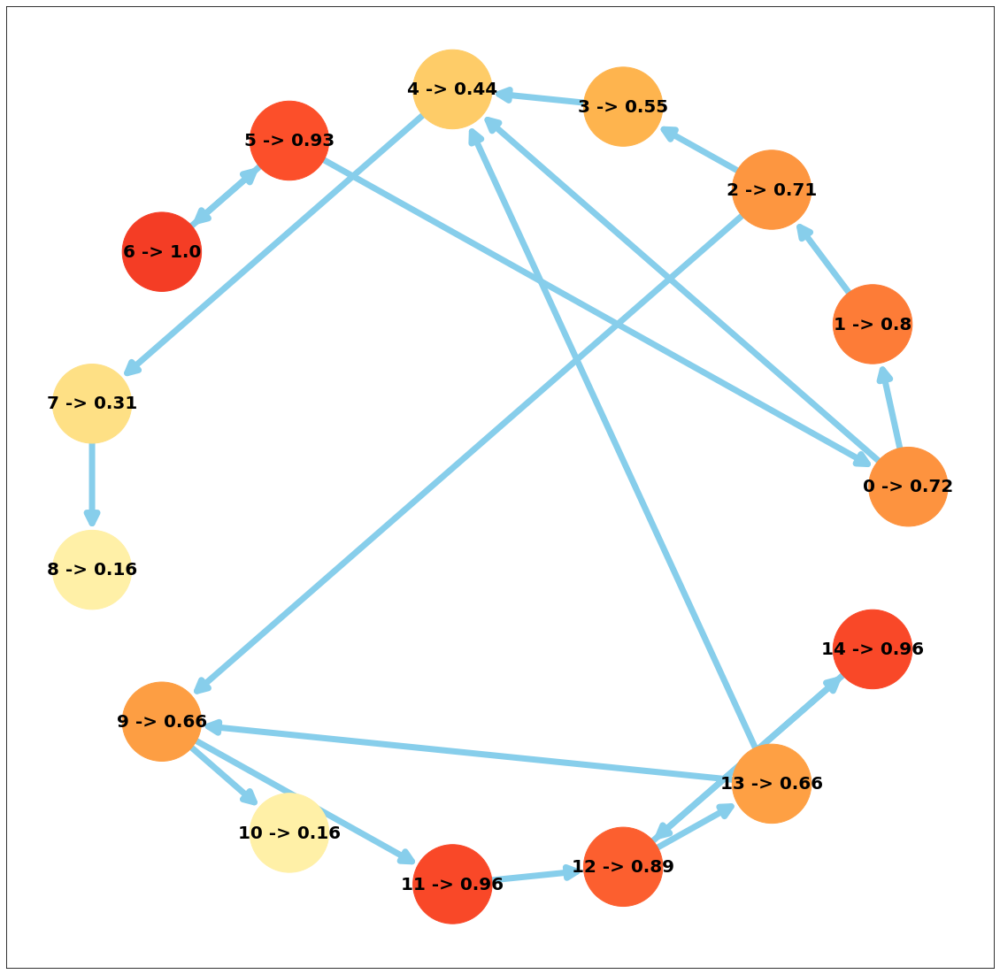

Wektor e: simple Parametr d: 0.85


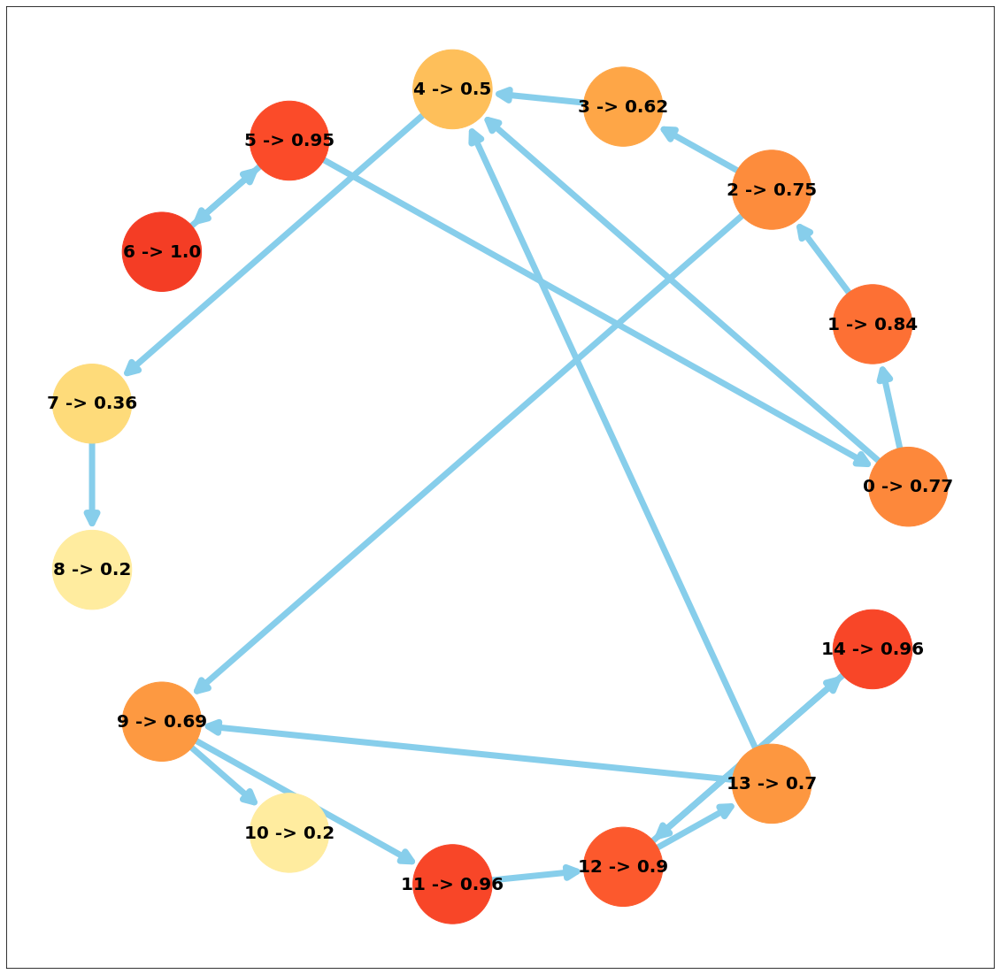

Wektor e: simple Parametr d: 0.75


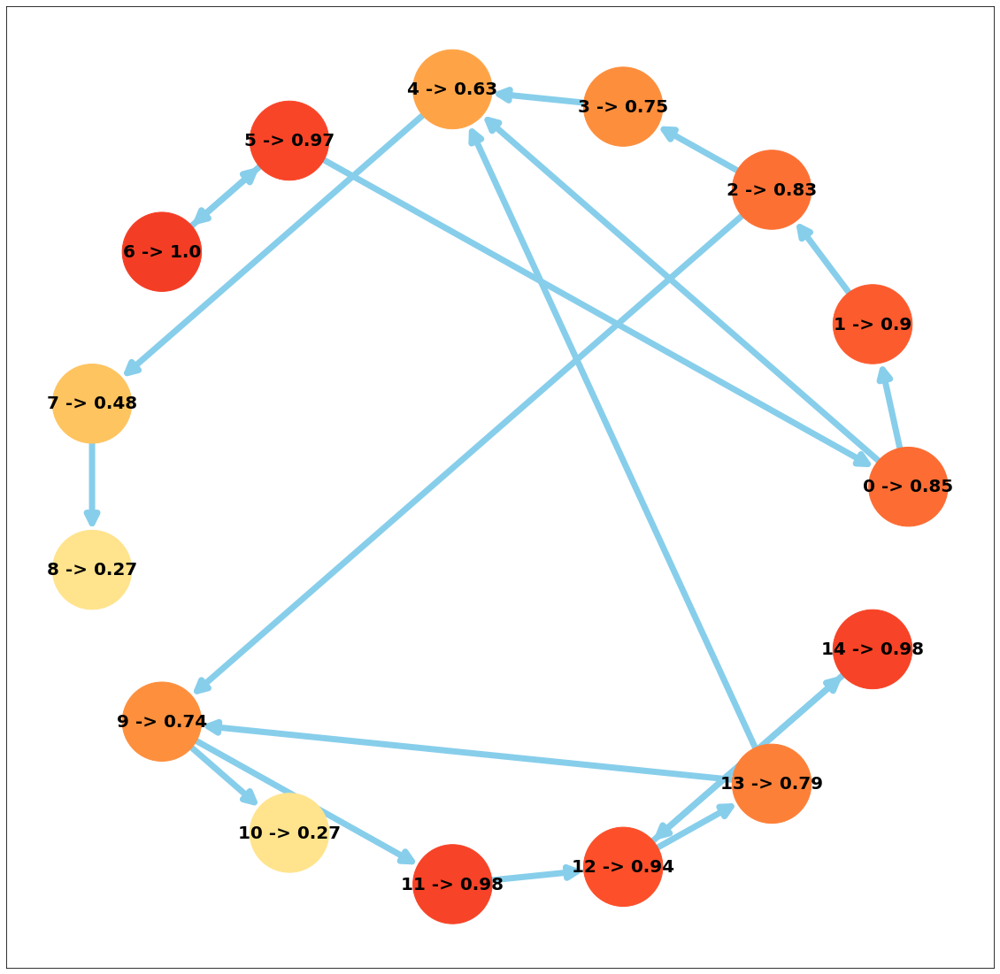

Wektor e: simple Parametr d: 0.6


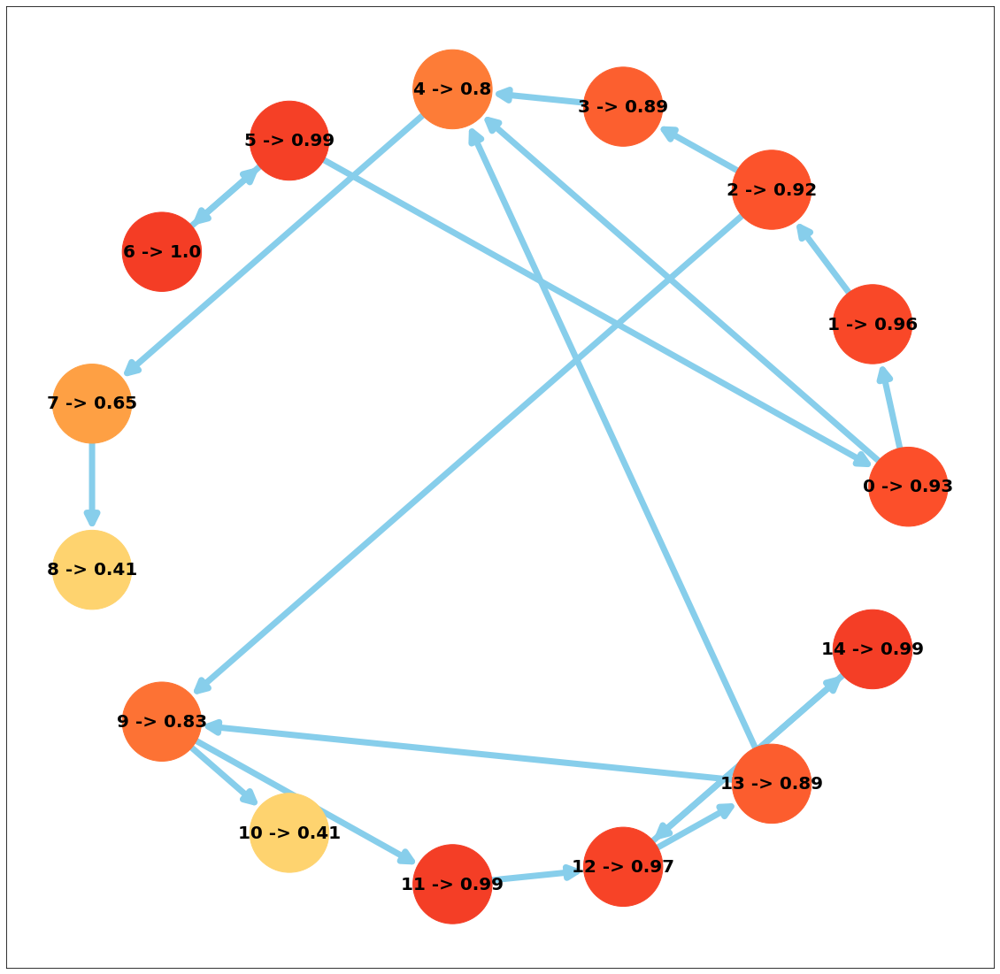

Wektor e: simple Parametr d: 0.5


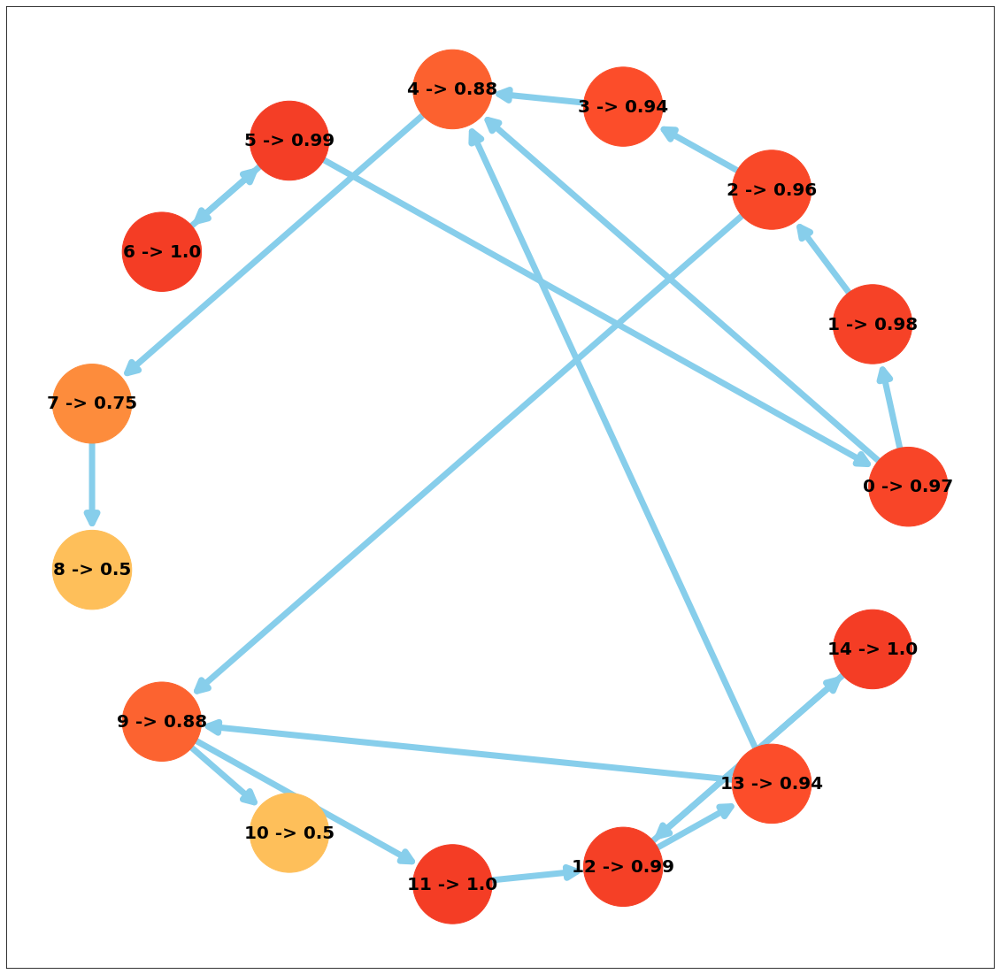

Wektor e: arange Parametr d: 0.9


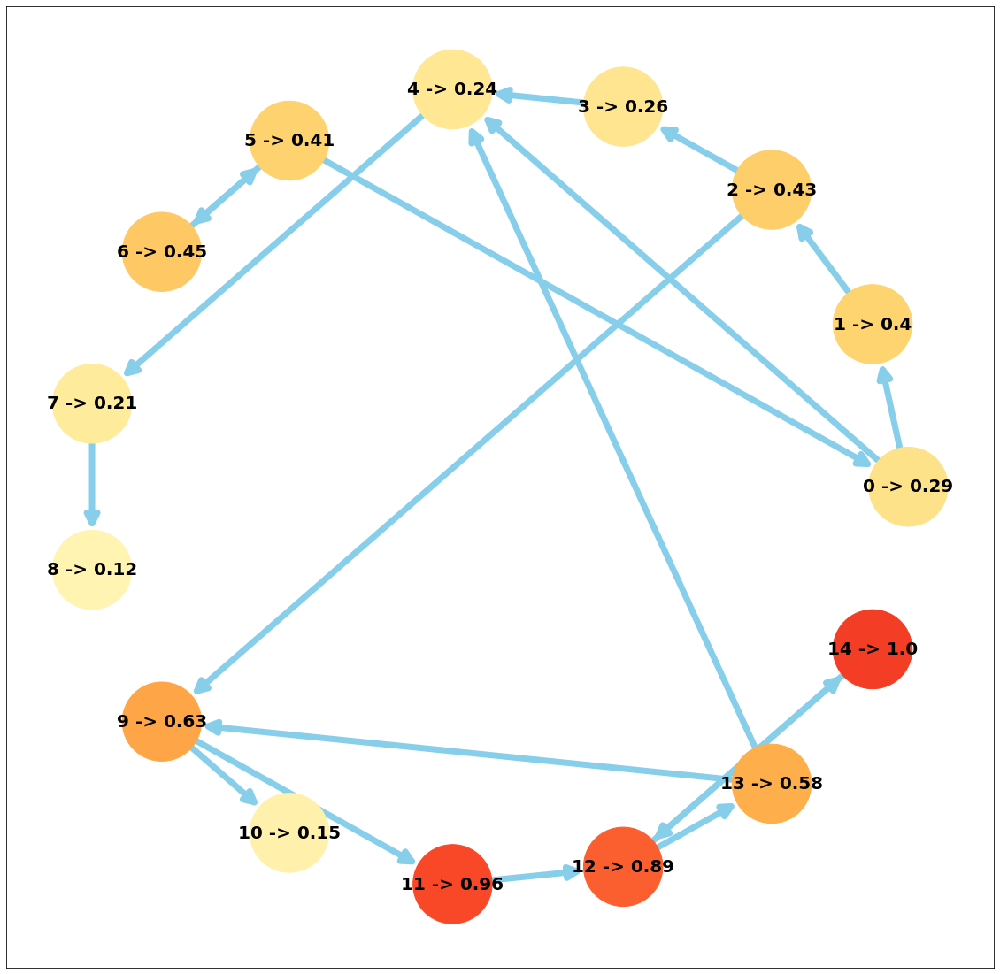

Wektor e: arange Parametr d: 0.85


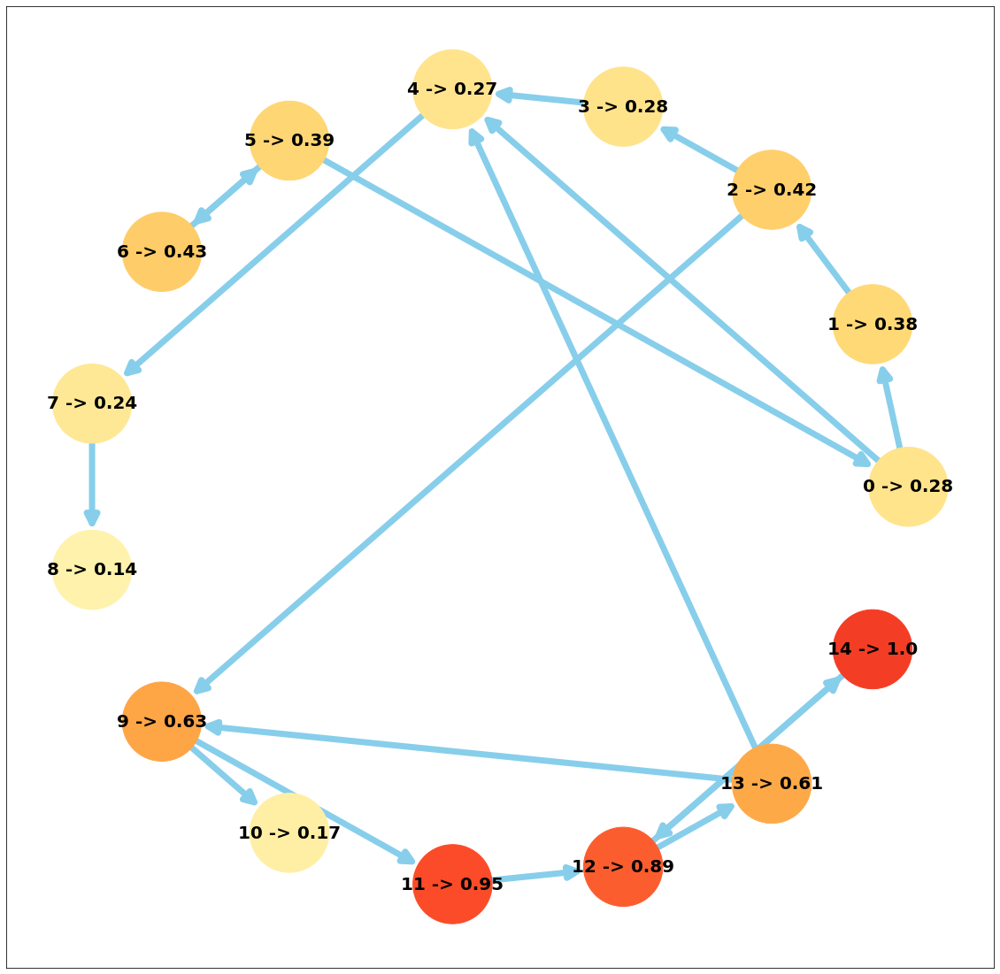

Wektor e: arange Parametr d: 0.75


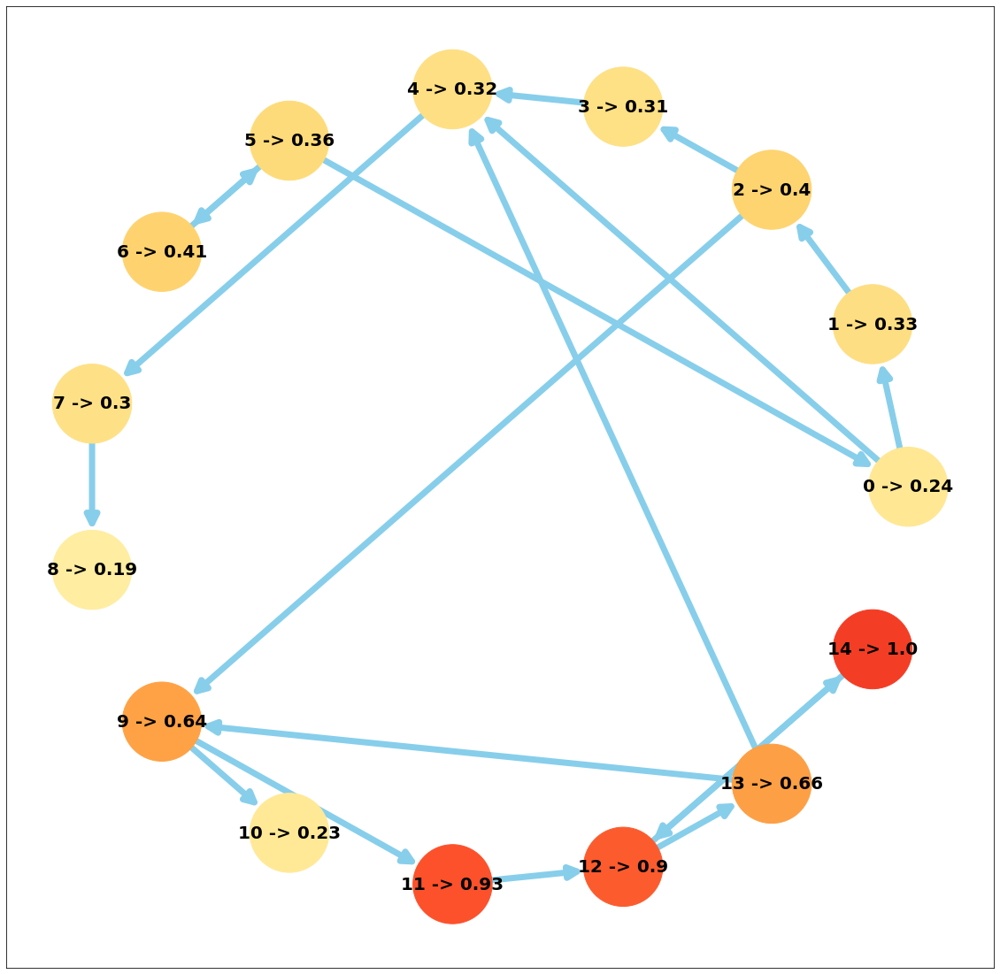

Wektor e: arange Parametr d: 0.6


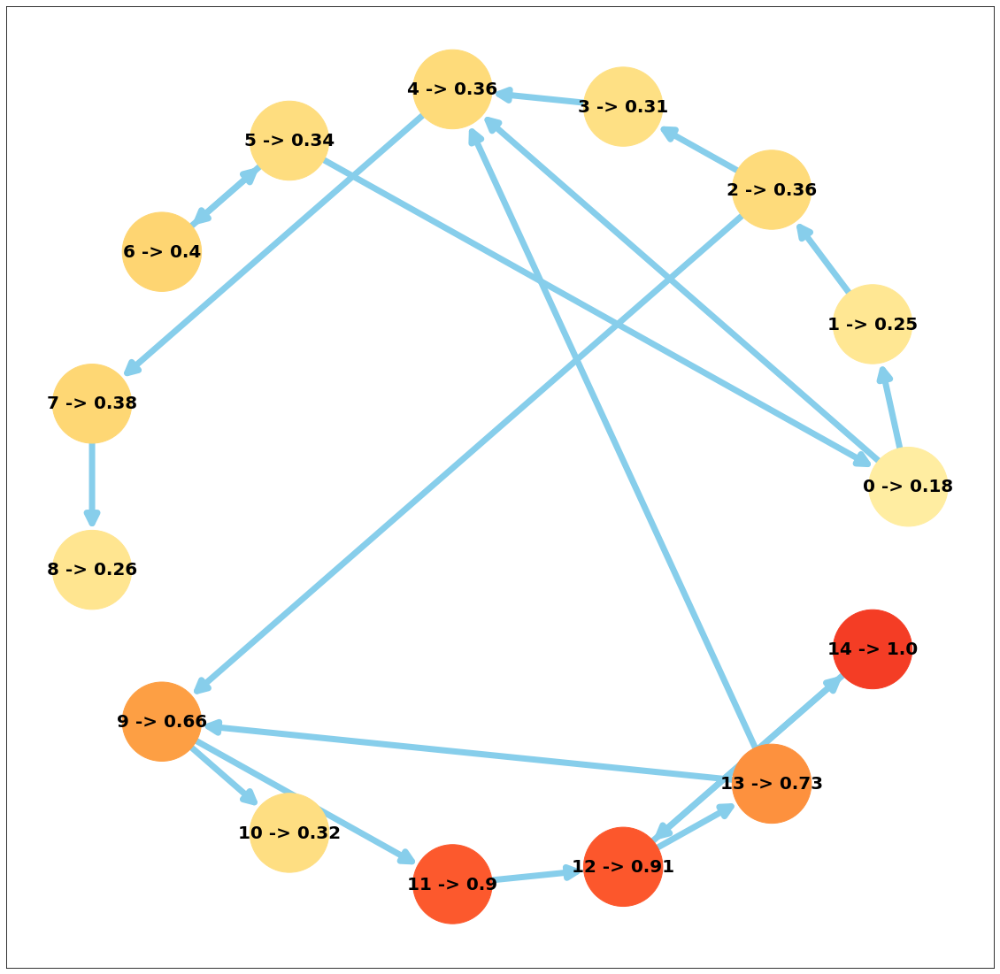

Wektor e: arange Parametr d: 0.5


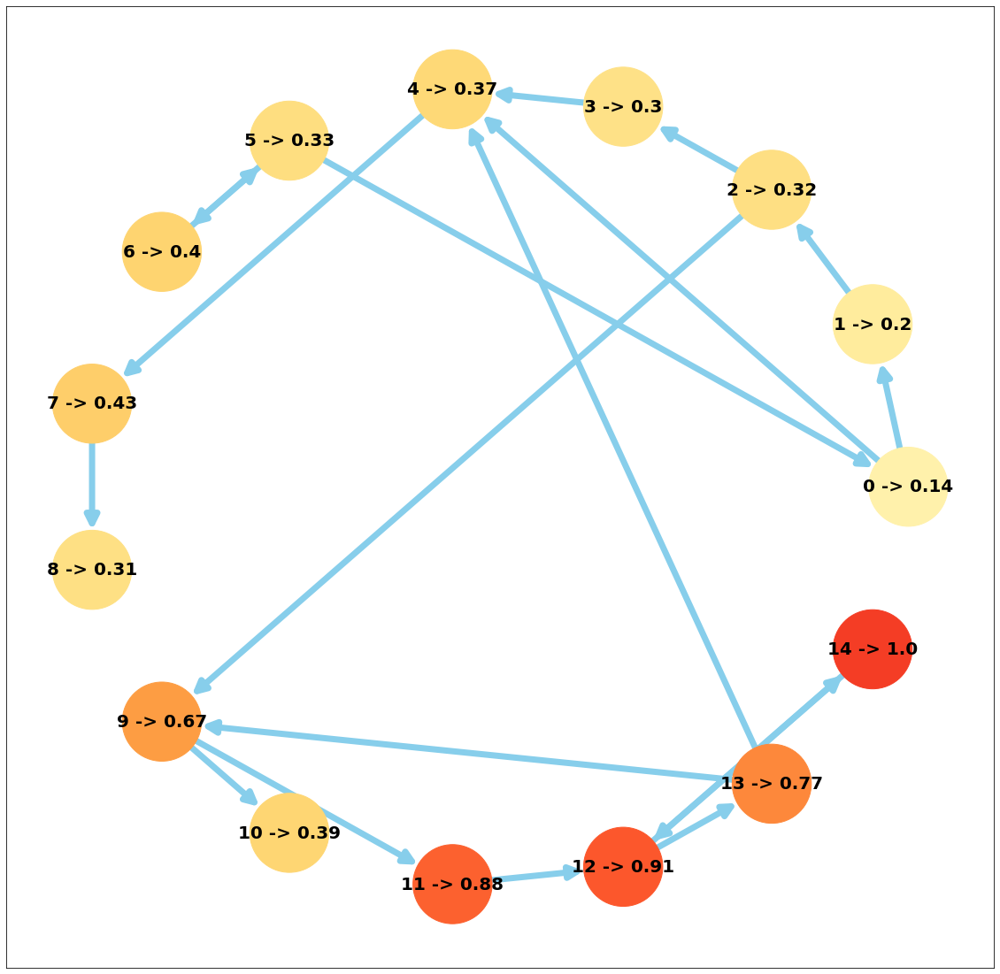

Wektor e: random Parametr d: 0.9


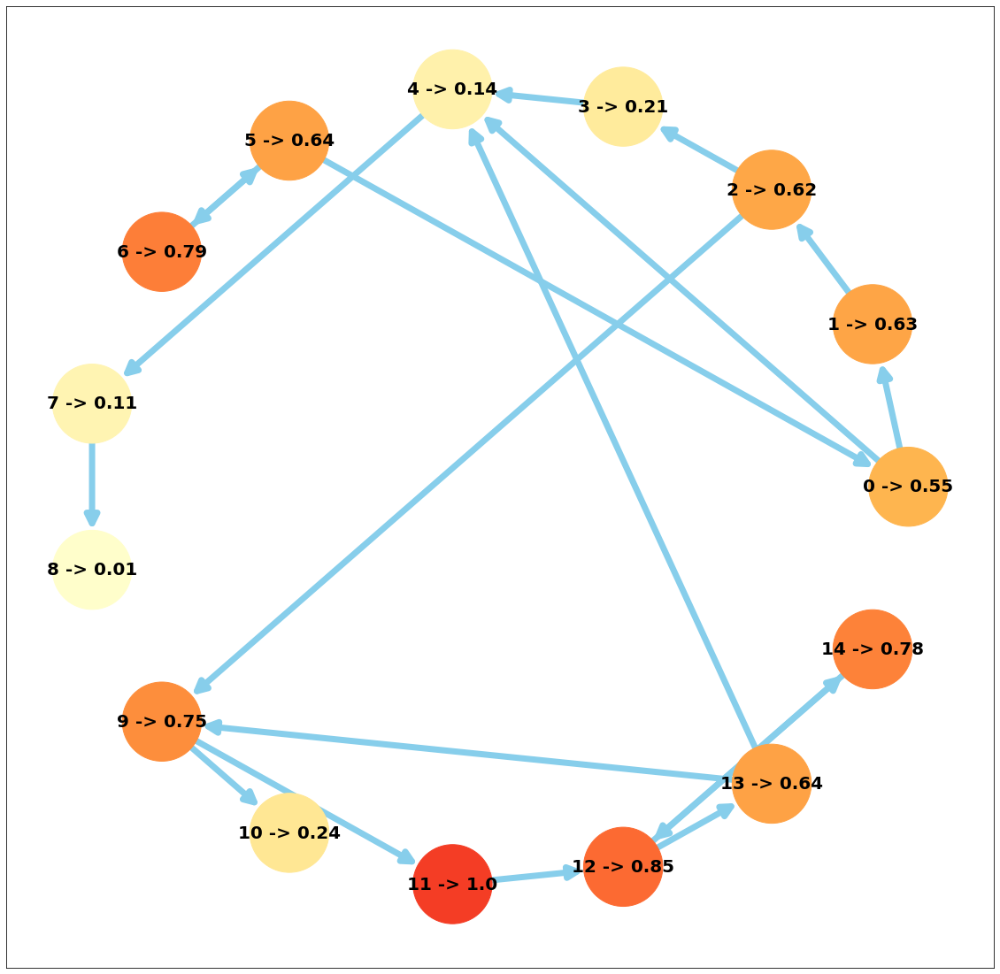

Wektor e: random Parametr d: 0.85


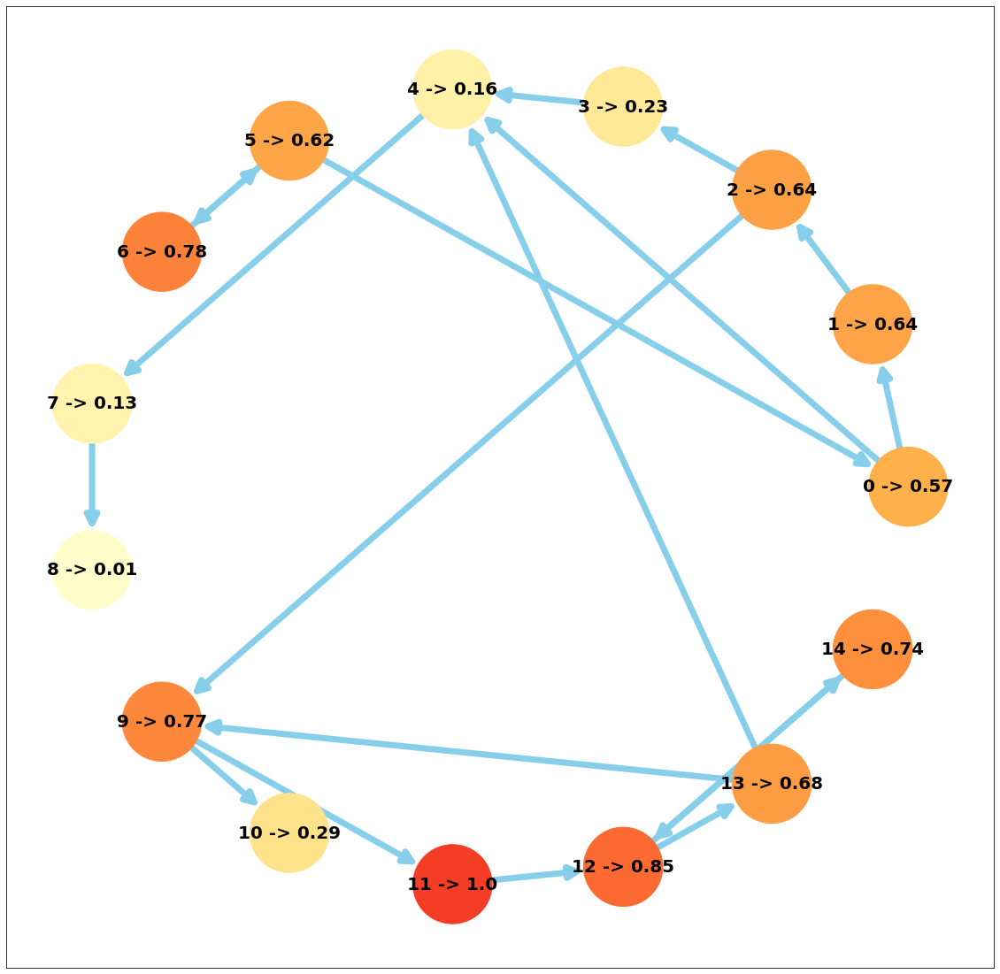

Wektor e: random Parametr d: 0.75


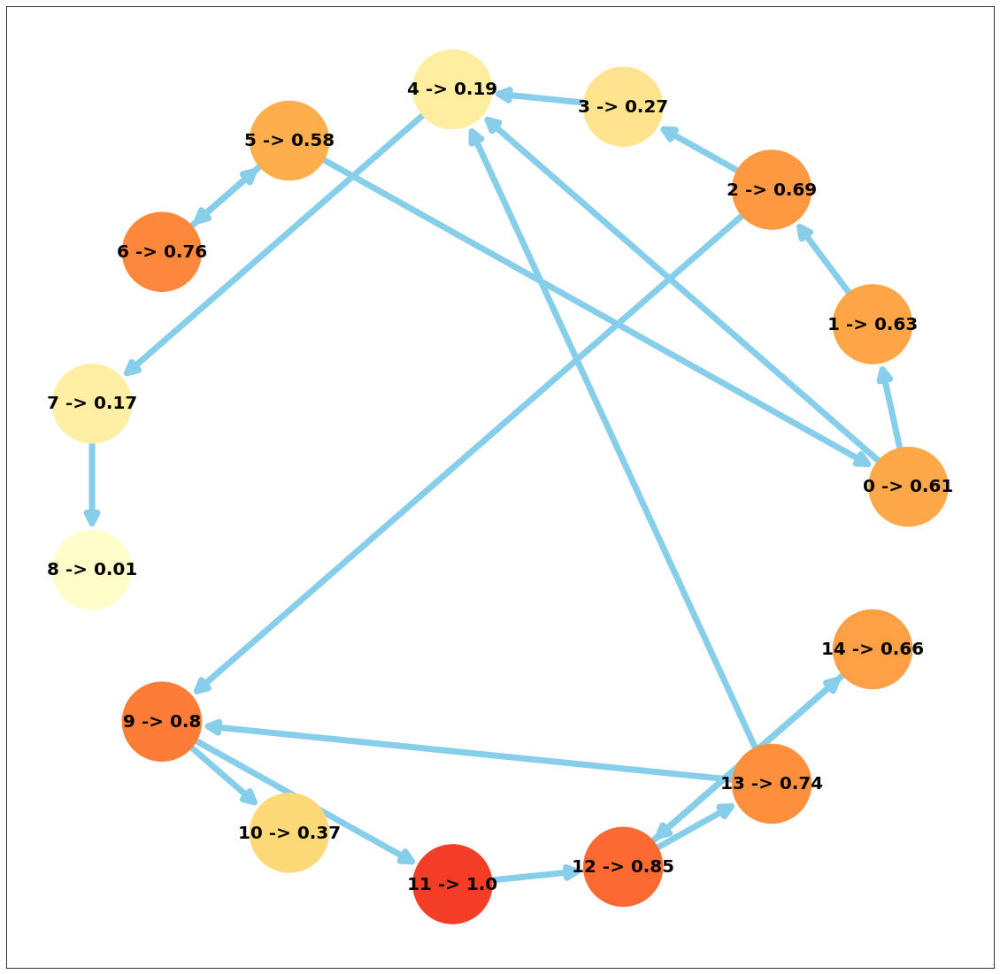

Wektor e: random Parametr d: 0.6


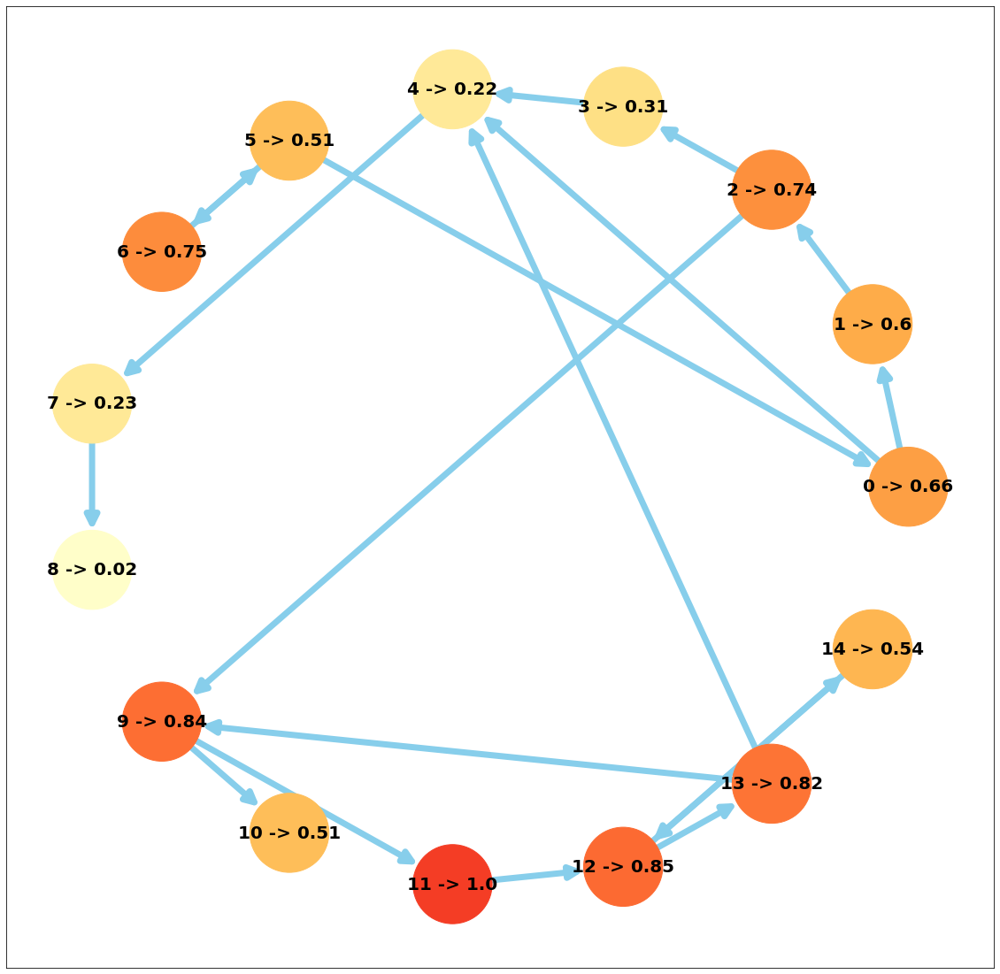

Wektor e: random Parametr d: 0.5


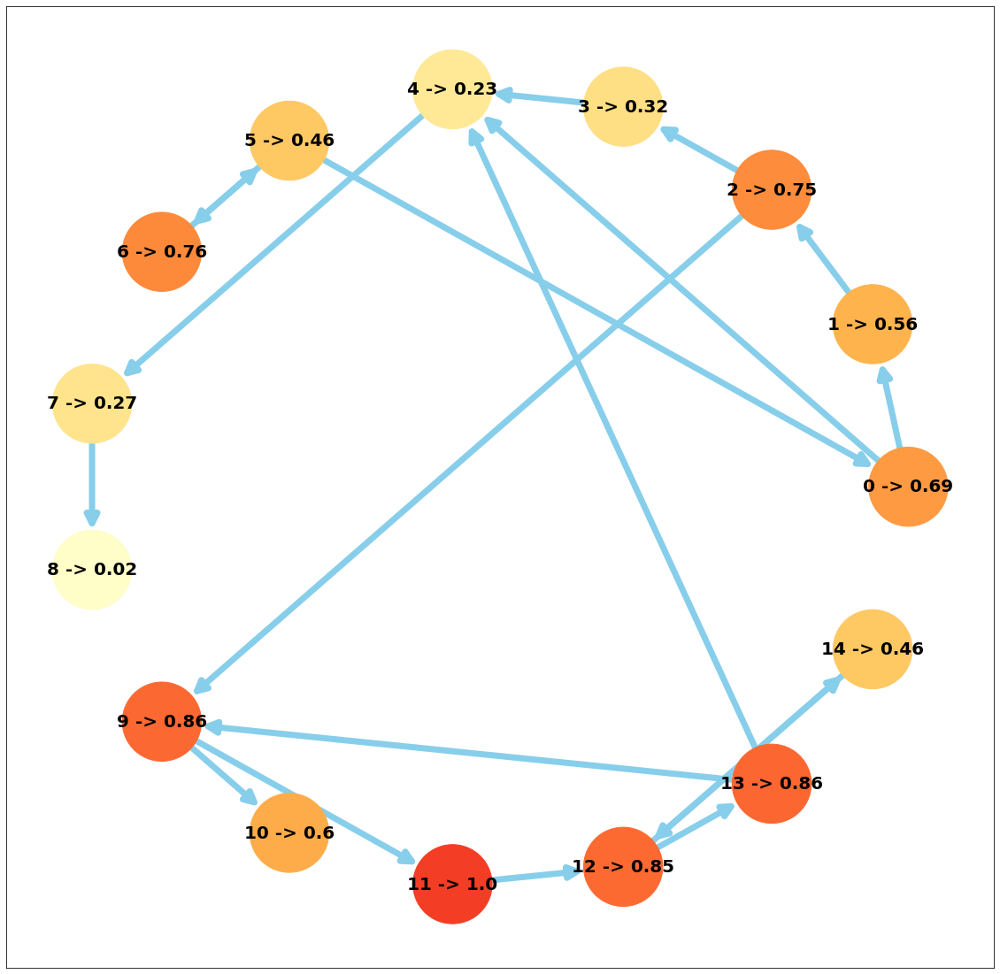

In [17]:
d_arr = [0.9, 0.85, 0.75, 0.6, 0.5]
e_arr = ["simple", "arange", "random"]
filepath = "graph5.txt"
A, size = make_adjacency_matrix(filepath)

for e_type in e_arr:
    if e_type == "simple":
        e = np.ones(size) / size
    elif e_type == "arange":
        e = np.arange(size)
        e = e / np.sum(e)
    elif e_type == "random":
        e = np.random.uniform(0, 1, size)
        e = e / np.sum(e)
    e = e.reshape(-1, 1)
    for d in d_arr:
        print ("Wektor e:", e_type, "Parametr d: " + str(d))
        B = d * A + (1 - d) * np.outer (e, np.ones(size))
        result = search_eigenvector(B, e)
        draw_page_rank (A, result)

Zgodnie z oczekiwaniami, zmniejszenie parametru d zwiększa szansę na przełączenie na losową stronę przez surfera. Powoduje to "spłaszczenie" wyników. Wartości rankingu stają się dla każdej ze stron wyższe (względem najwyższego). Im większy parametr d tym większe znaczenie mają linki do kolejnych stron. Jednakże nie może mieć on wartości 1, ponieważ jest to niezgodne z heurystyką mówiącą o losowym błądzeniu od czasu do czasu i wyłącza znaczenie wektora e. Nie miałoby to też sensu bo strony nie mające krawędzi wchodzących lub mające ich niewiele spadły by mocno w rankingu i mogły by być nieosiągalne.

Możemy zauważyć, jak wybór wektora e ma duży wpływa na algorytm page rank. Podbicie nim wartości dla danej strony od razu podnosi ją w rankingu. Możemy w ten sposób podbić wartości stron ważnych dla danego konkretnego użytkownika na podstawie informacji o nim (lokalizacji, wieku, zainteresowaniach, historii oglądanych stron). Odpowiedni wektor e i mała wartość współczynnika d pozwala wyróżnic strony które posiadają mało linków. W ten sposób możemy indywidualnie podbijać konkretne strony w wyszukiwarce wedle uznania administratora.

### Testy z bazy SNAP

Dwa wywołania dla dużych grafów z bazy SNAP.

In [18]:
res1 = page_rank(filepath = "Wiki-Vote.txt")
res1 /= np.amax(res1)
for i, val in enumerate(res1):
    print (val, "-> strona:", i)

[0.20769674] -> strona: 0
[0.20769674] -> strona: 1
[0.20769674] -> strona: 2
[0.65803387] -> strona: 3
[0.67563488] -> strona: 4
[0.70054953] -> strona: 5
[0.61800689] -> strona: 6
[0.64285052] -> strona: 7
[0.61519874] -> strona: 8
[0.61294422] -> strona: 9
[0.63335688] -> strona: 10
[0.64047047] -> strona: 11
[0.61989272] -> strona: 12
[0.60336745] -> strona: 13
[0.61394907] -> strona: 14
[0.62233867] -> strona: 15
[0.60798249] -> strona: 16
[0.6217781] -> strona: 17
[0.6485661] -> strona: 18
[0.62619648] -> strona: 19
[0.6366195] -> strona: 20
[0.64788399] -> strona: 21
[0.72948354] -> strona: 22
[0.62751008] -> strona: 23
[0.66180755] -> strona: 24
[0.64472176] -> strona: 25
[0.62088372] -> strona: 26
[0.61950359] -> strona: 27
[0.62516316] -> strona: 28
[0.62128652] -> strona: 29
[0.60780583] -> strona: 30
[0.53025253] -> strona: 31
[0.49685738] -> strona: 32
[0.61809431] -> strona: 33
[0.73626364] -> strona: 34
[0.6189548] -> strona: 35
[0.65731655] -> strona: 36
[0.57526411] ->

[0.20769674] -> strona: 617
[0.61705773] -> strona: 618
[0.20769674] -> strona: 619
[0.56691743] -> strona: 620
[0.83265016] -> strona: 621
[0.20769674] -> strona: 622
[0.20769674] -> strona: 623
[0.58482891] -> strona: 624
[0.74886199] -> strona: 625
[0.63380259] -> strona: 626
[0.20769674] -> strona: 627
[0.67967308] -> strona: 628
[0.20769674] -> strona: 629
[0.20769674] -> strona: 630
[0.20769674] -> strona: 631
[0.74808729] -> strona: 632
[0.64244132] -> strona: 633
[0.66994054] -> strona: 634
[0.60366426] -> strona: 635
[0.61459884] -> strona: 636
[0.65091709] -> strona: 637
[0.74808729] -> strona: 638
[0.62915058] -> strona: 639
[0.57123582] -> strona: 640
[0.74823437] -> strona: 641
[0.61953997] -> strona: 642
[0.60650136] -> strona: 643
[0.65962502] -> strona: 644
[0.58721479] -> strona: 645
[0.65775312] -> strona: 646
[0.59854732] -> strona: 647
[0.75242852] -> strona: 648
[0.62609822] -> strona: 649
[0.60829526] -> strona: 650
[0.38423897] -> strona: 651
[0.52853071] -> stro

[0.73466627] -> strona: 1324
[0.38423897] -> strona: 1325
[0.56196651] -> strona: 1326
[0.38423897] -> strona: 1327
[0.5736777] -> strona: 1328
[0.56686649] -> strona: 1329
[0.20769674] -> strona: 1330
[0.70957832] -> strona: 1331
[0.73380833] -> strona: 1332
[0.78247732] -> strona: 1333
[0.75992459] -> strona: 1334
[0.64682894] -> strona: 1335
[0.72467947] -> strona: 1336
[0.75992459] -> strona: 1337
[0.62626634] -> strona: 1338
[0.60965638] -> strona: 1339
[0.63576002] -> strona: 1340
[0.57208178] -> strona: 1341
[0.66924221] -> strona: 1342
[0.75353277] -> strona: 1343
[0.79353633] -> strona: 1344
[0.75992459] -> strona: 1345
[0.62968031] -> strona: 1346
[0.20769674] -> strona: 1347
[0.20769674] -> strona: 1348
[0.76078033] -> strona: 1349
[0.65006659] -> strona: 1350
[0.75412694] -> strona: 1351
[0.61937877] -> strona: 1352
[0.75528714] -> strona: 1353
[0.58679273] -> strona: 1354
[0.50753497] -> strona: 1355
[0.65888035] -> strona: 1356
[0.67416579] -> strona: 1357
[0.68024591] ->

[0.55342396] -> strona: 2071
[0.66985833] -> strona: 2072
[0.20769674] -> strona: 2073
[0.20769674] -> strona: 2074
[0.20769674] -> strona: 2075
[0.20769674] -> strona: 2076
[0.75934564] -> strona: 2077
[0.20769674] -> strona: 2078
[0.20769674] -> strona: 2079
[0.20769674] -> strona: 2080
[0.76674626] -> strona: 2081
[0.76674626] -> strona: 2082
[0.56376276] -> strona: 2083
[0.60361657] -> strona: 2084
[0.69228061] -> strona: 2085
[0.72785865] -> strona: 2086
[0.72785865] -> strona: 2087
[0.66068836] -> strona: 2088
[0.72785865] -> strona: 2089
[0.72785865] -> strona: 2090
[0.6209982] -> strona: 2091
[0.59930589] -> strona: 2092
[0.63813694] -> strona: 2093
[0.38423897] -> strona: 2094
[0.61195518] -> strona: 2095
[0.75364985] -> strona: 2096
[0.58428757] -> strona: 2097
[0.20769674] -> strona: 2098
[0.61675328] -> strona: 2099
[0.38423897] -> strona: 2100
[0.20769674] -> strona: 2101
[0.68279153] -> strona: 2102
[0.56611142] -> strona: 2103
[0.55943718] -> strona: 2104
[0.63289376] ->

[0.64412872] -> strona: 2802
[0.38423897] -> strona: 2803
[0.70061055] -> strona: 2804
[0.20769674] -> strona: 2805
[0.20769674] -> strona: 2806
[0.60502563] -> strona: 2807
[0.56568996] -> strona: 2808
[0.20769674] -> strona: 2809
[0.20769674] -> strona: 2810
[0.61289217] -> strona: 2811
[0.20769674] -> strona: 2812
[0.38423897] -> strona: 2813
[0.20769674] -> strona: 2814
[0.67555855] -> strona: 2815
[0.20769674] -> strona: 2816
[0.45926942] -> strona: 2817
[0.38423897] -> strona: 2818
[0.58160673] -> strona: 2819
[0.20769674] -> strona: 2820
[0.20769674] -> strona: 2821
[0.66530501] -> strona: 2822
[0.38423897] -> strona: 2823
[0.38423897] -> strona: 2824
[0.20769674] -> strona: 2825
[0.38423897] -> strona: 2826
[0.38423897] -> strona: 2827
[0.20769674] -> strona: 2828
[0.20769674] -> strona: 2829
[0.65142884] -> strona: 2830
[0.69127194] -> strona: 2831
[0.60050169] -> strona: 2832
[0.69598277] -> strona: 2833
[0.63244782] -> strona: 2834
[0.38423897] -> strona: 2835
[0.20769674] -

[0.66284818] -> strona: 3555
[0.66055983] -> strona: 3556
[0.70536151] -> strona: 3557
[0.76923792] -> strona: 3558
[0.20769674] -> strona: 3559
[0.66463984] -> strona: 3560
[0.68775645] -> strona: 3561
[0.63319387] -> strona: 3562
[0.67589] -> strona: 3563
[0.79139726] -> strona: 3564
[0.77173553] -> strona: 3565
[0.77173553] -> strona: 3566
[0.69684254] -> strona: 3567
[0.6611341] -> strona: 3568
[0.65905133] -> strona: 3569
[0.20769674] -> strona: 3570
[0.6693471] -> strona: 3571
[0.20769674] -> strona: 3572
[0.20769674] -> strona: 3573
[0.20769674] -> strona: 3574
[0.20769674] -> strona: 3575
[0.66444716] -> strona: 3576
[0.74850409] -> strona: 3577
[0.38423897] -> strona: 3578
[0.38423897] -> strona: 3579
[0.20769674] -> strona: 3580
[0.69744245] -> strona: 3581
[0.69744245] -> strona: 3582
[0.74328393] -> strona: 3583
[0.69744245] -> strona: 3584
[0.54084071] -> strona: 3585
[0.65709554] -> strona: 3586
[0.57617142] -> strona: 3587
[0.20769674] -> strona: 3588
[0.79661033] -> str

[0.71735313] -> strona: 4276
[0.78222008] -> strona: 4277
[0.78222008] -> strona: 4278
[0.78222008] -> strona: 4279
[0.78222008] -> strona: 4280
[0.20769674] -> strona: 4281
[0.71771638] -> strona: 4282
[0.38423897] -> strona: 4283
[0.38423897] -> strona: 4284
[0.38423897] -> strona: 4285
[0.20769674] -> strona: 4286
[0.20769674] -> strona: 4287
[0.20769674] -> strona: 4288
[0.20769674] -> strona: 4289
[0.75310797] -> strona: 4290
[0.58743148] -> strona: 4291
[0.77916553] -> strona: 4292
[0.20769674] -> strona: 4293
[0.20769674] -> strona: 4294
[0.65730571] -> strona: 4295
[0.38423897] -> strona: 4296
[0.67314241] -> strona: 4297
[0.74458195] -> strona: 4298
[0.20769674] -> strona: 4299
[0.20769674] -> strona: 4300
[0.20769674] -> strona: 4301
[0.20769674] -> strona: 4302
[0.20769674] -> strona: 4303
[0.65661116] -> strona: 4304
[0.65661116] -> strona: 4305
[0.65661116] -> strona: 4306
[0.60265535] -> strona: 4307
[0.7409099] -> strona: 4308
[0.20769674] -> strona: 4309
[0.65725377] ->

[0.20769674] -> strona: 5026
[0.20769674] -> strona: 5027
[0.65237135] -> strona: 5028
[0.72073328] -> strona: 5029
[0.20769674] -> strona: 5030
[0.91036699] -> strona: 5031
[0.83551611] -> strona: 5032
[0.20769674] -> strona: 5033
[0.20769674] -> strona: 5034
[0.78745999] -> strona: 5035
[0.66564355] -> strona: 5036
[0.67372208] -> strona: 5037
[0.72695008] -> strona: 5038
[0.66638815] -> strona: 5039
[0.64805258] -> strona: 5040
[0.20769674] -> strona: 5041
[0.20769674] -> strona: 5042
[0.55221973] -> strona: 5043
[0.20769674] -> strona: 5044
[0.20769674] -> strona: 5045
[0.77064972] -> strona: 5046
[0.79388809] -> strona: 5047
[0.73547241] -> strona: 5048
[0.20769674] -> strona: 5049
[0.66374395] -> strona: 5050
[0.56367099] -> strona: 5051
[0.38423897] -> strona: 5052
[0.60822538] -> strona: 5053
[0.38423897] -> strona: 5054
[0.20769674] -> strona: 5055
[0.20769674] -> strona: 5056
[0.38423897] -> strona: 5057
[0.20769674] -> strona: 5058
[0.64285507] -> strona: 5059
[0.51058932] -

[0.74771628] -> strona: 5751
[0.74771628] -> strona: 5752
[0.56518984] -> strona: 5753
[0.20769674] -> strona: 5754
[0.38423897] -> strona: 5755
[0.20769674] -> strona: 5756
[0.781146] -> strona: 5757
[0.20769674] -> strona: 5758
[0.20769674] -> strona: 5759
[0.63822892] -> strona: 5760
[0.65243214] -> strona: 5761
[0.20769674] -> strona: 5762
[0.65973439] -> strona: 5763
[0.75637012] -> strona: 5764
[0.75637012] -> strona: 5765
[0.38423897] -> strona: 5766
[0.20769674] -> strona: 5767
[0.60389666] -> strona: 5768
[0.76518213] -> strona: 5769
[0.60390977] -> strona: 5770
[0.66093296] -> strona: 5771
[0.69216859] -> strona: 5772
[0.61809687] -> strona: 5773
[0.74725749] -> strona: 5774
[0.63477734] -> strona: 5775
[0.6230388] -> strona: 5776
[0.20769674] -> strona: 5777
[0.20769674] -> strona: 5778
[0.20769674] -> strona: 5779
[0.20769674] -> strona: 5780
[0.72430762] -> strona: 5781
[0.20769674] -> strona: 5782
[0.63406891] -> strona: 5783
[0.38423897] -> strona: 5784
[0.77680692] -> s

[0.76959978] -> strona: 6478
[0.71956604] -> strona: 6479
[0.38423897] -> strona: 6480
[0.20769674] -> strona: 6481
[0.20769674] -> strona: 6482
[0.59179024] -> strona: 6483
[0.60557158] -> strona: 6484
[0.38423897] -> strona: 6485
[0.63569526] -> strona: 6486
[0.69071203] -> strona: 6487
[0.6483827] -> strona: 6488
[0.68427098] -> strona: 6489
[0.62894068] -> strona: 6490
[0.65718506] -> strona: 6491
[0.55869819] -> strona: 6492
[0.38423897] -> strona: 6493
[0.64028688] -> strona: 6494
[0.38423897] -> strona: 6495
[0.20769674] -> strona: 6496
[0.38423897] -> strona: 6497
[0.20769674] -> strona: 6498
[0.20769674] -> strona: 6499
[0.67001671] -> strona: 6500
[0.67723949] -> strona: 6501
[0.59655602] -> strona: 6502
[0.65317673] -> strona: 6503
[0.63903528] -> strona: 6504
[0.20769674] -> strona: 6505
[0.74926758] -> strona: 6506
[0.74926758] -> strona: 6507
[0.74926758] -> strona: 6508
[0.74926758] -> strona: 6509
[0.62259899] -> strona: 6510
[0.20769674] -> strona: 6511
[0.20769674] ->

[0.7334094] -> strona: 7140
[0.20769674] -> strona: 7141
[0.56713478] -> strona: 7142
[0.20769674] -> strona: 7143
[0.20769674] -> strona: 7144
[0.38423897] -> strona: 7145
[0.38423897] -> strona: 7146
[0.20769674] -> strona: 7147
[0.20769674] -> strona: 7148
[0.20769674] -> strona: 7149
[0.69723357] -> strona: 7150
[0.70315129] -> strona: 7151
[0.20769674] -> strona: 7152
[0.63914112] -> strona: 7153
[0.76774715] -> strona: 7154
[0.76774715] -> strona: 7155
[0.76774715] -> strona: 7156
[0.76774715] -> strona: 7157
[0.76774715] -> strona: 7158
[0.76774715] -> strona: 7159
[0.76774715] -> strona: 7160
[0.20769674] -> strona: 7161
[0.20769674] -> strona: 7162
[0.38423897] -> strona: 7163
[0.76945248] -> strona: 7164
[0.49660153] -> strona: 7165
[0.38423897] -> strona: 7166
[0.38423897] -> strona: 7167
[0.20769674] -> strona: 7168
[0.20769674] -> strona: 7169
[0.70273521] -> strona: 7170
[0.54786178] -> strona: 7171
[0.74904393] -> strona: 7172
[0.75770456] -> strona: 7173
[0.73307909] ->

[0.57468246] -> strona: 7837
[0.20769674] -> strona: 7838
[0.20769674] -> strona: 7839
[0.20769674] -> strona: 7840
[0.74708279] -> strona: 7841
[0.78112906] -> strona: 7842
[0.83774647] -> strona: 7843
[0.76512596] -> strona: 7844
[0.57468246] -> strona: 7845
[0.20769674] -> strona: 7846
[0.20769674] -> strona: 7847
[0.76512596] -> strona: 7848
[0.72799081] -> strona: 7849
[0.72799081] -> strona: 7850
[0.72799081] -> strona: 7851
[0.72799081] -> strona: 7852
[0.38423897] -> strona: 7853
[0.38423897] -> strona: 7854
[0.20769674] -> strona: 7855
[0.63057722] -> strona: 7856
[0.20769674] -> strona: 7857
[0.20769674] -> strona: 7858
[0.20769674] -> strona: 7859
[0.81553802] -> strona: 7860
[0.72835011] -> strona: 7861
[0.60354389] -> strona: 7862
[0.79713218] -> strona: 7863
[0.85374958] -> strona: 7864
[0.67298839] -> strona: 7865
[0.76105469] -> strona: 7866
[0.38423897] -> strona: 7867
[0.38423897] -> strona: 7868
[0.38423897] -> strona: 7869
[0.38423897] -> strona: 7870
[0.20769674] -

In [19]:
res2 = page_rank(filepath = "big_graph.txt")
res2 /= np.amax(res2)
for i, val in enumerate(res1):
    print (val, "-> strona:", i)

[0.20769674] -> strona: 0
[0.20769674] -> strona: 1
[0.20769674] -> strona: 2
[0.65803387] -> strona: 3
[0.67563488] -> strona: 4
[0.70054953] -> strona: 5
[0.61800689] -> strona: 6
[0.64285052] -> strona: 7
[0.61519874] -> strona: 8
[0.61294422] -> strona: 9
[0.63335688] -> strona: 10
[0.64047047] -> strona: 11
[0.61989272] -> strona: 12
[0.60336745] -> strona: 13
[0.61394907] -> strona: 14
[0.62233867] -> strona: 15
[0.60798249] -> strona: 16
[0.6217781] -> strona: 17
[0.6485661] -> strona: 18
[0.62619648] -> strona: 19
[0.6366195] -> strona: 20
[0.64788399] -> strona: 21
[0.72948354] -> strona: 22
[0.62751008] -> strona: 23
[0.66180755] -> strona: 24
[0.64472176] -> strona: 25
[0.62088372] -> strona: 26
[0.61950359] -> strona: 27
[0.62516316] -> strona: 28
[0.62128652] -> strona: 29
[0.60780583] -> strona: 30
[0.53025253] -> strona: 31
[0.49685738] -> strona: 32
[0.61809431] -> strona: 33
[0.73626364] -> strona: 34
[0.6189548] -> strona: 35
[0.65731655] -> strona: 36
[0.57526411] ->

[0.62609822] -> strona: 649
[0.60829526] -> strona: 650
[0.38423897] -> strona: 651
[0.52853071] -> strona: 652
[0.38423897] -> strona: 653
[0.38423897] -> strona: 654
[0.38423897] -> strona: 655
[0.20769674] -> strona: 656
[0.61011392] -> strona: 657
[0.69273535] -> strona: 658
[0.62910974] -> strona: 659
[0.20769674] -> strona: 660
[0.59038038] -> strona: 661
[0.78533222] -> strona: 662
[0.64888691] -> strona: 663
[0.53453966] -> strona: 664
[0.65343492] -> strona: 665
[0.77460401] -> strona: 666
[0.68046453] -> strona: 667
[0.53765772] -> strona: 668
[0.38423897] -> strona: 669
[0.20769674] -> strona: 670
[0.20769674] -> strona: 671
[0.78395567] -> strona: 672
[0.67795167] -> strona: 673
[0.61207335] -> strona: 674
[0.38423897] -> strona: 675
[0.74056778] -> strona: 676
[0.6269071] -> strona: 677
[0.38423897] -> strona: 678
[0.50610722] -> strona: 679
[0.20769674] -> strona: 680
[0.20769674] -> strona: 681
[0.7100258] -> strona: 682
[0.65252807] -> strona: 683
[0.52333096] -> strona

[0.64096901] -> strona: 1428
[0.68421221] -> strona: 1429
[0.56976103] -> strona: 1430
[0.75528309] -> strona: 1431
[0.739613] -> strona: 1432
[0.7525204] -> strona: 1433
[0.5837402] -> strona: 1434
[0.20769674] -> strona: 1435
[0.53429988] -> strona: 1436
[0.20769674] -> strona: 1437
[0.68536828] -> strona: 1438
[0.67711139] -> strona: 1439
[0.75655236] -> strona: 1440
[0.62746187] -> strona: 1441
[0.68411277] -> strona: 1442
[0.76094608] -> strona: 1443
[0.78912878] -> strona: 1444
[0.78906497] -> strona: 1445
[0.68396262] -> strona: 1446
[0.61416338] -> strona: 1447
[0.7630536] -> strona: 1448
[0.7630536] -> strona: 1449
[0.7630536] -> strona: 1450
[0.62412174] -> strona: 1451
[0.38423897] -> strona: 1452
[0.20769674] -> strona: 1453
[0.38423897] -> strona: 1454
[0.38423897] -> strona: 1455
[0.38423897] -> strona: 1456
[0.70704542] -> strona: 1457
[0.38423897] -> strona: 1458
[0.38423897] -> strona: 1459
[0.38423897] -> strona: 1460
[0.38423897] -> strona: 1461
[0.58485407] -> stron

[0.20769674] -> strona: 2208
[0.65507686] -> strona: 2209
[0.60312663] -> strona: 2210
[0.20769674] -> strona: 2211
[0.77448379] -> strona: 2212
[0.77448379] -> strona: 2213
[0.64825825] -> strona: 2214
[0.58781336] -> strona: 2215
[0.72857638] -> strona: 2216
[0.66183811] -> strona: 2217
[0.87845621] -> strona: 2218
[0.87845621] -> strona: 2219
[0.20769674] -> strona: 2220
[0.80147673] -> strona: 2221
[0.80147673] -> strona: 2222
[0.63896647] -> strona: 2223
[0.67941005] -> strona: 2224
[0.6872898] -> strona: 2225
[0.71356269] -> strona: 2226
[0.76430959] -> strona: 2227
[0.83748589] -> strona: 2228
[0.64021584] -> strona: 2229
[0.6164874] -> strona: 2230
[0.57717131] -> strona: 2231
[0.48220826] -> strona: 2232
[0.63616287] -> strona: 2233
[0.7409284] -> strona: 2234
[0.77083422] -> strona: 2235
[0.68529277] -> strona: 2236
[0.68428623] -> strona: 2237
[0.73554522] -> strona: 2238
[0.81535292] -> strona: 2239
[0.63766512] -> strona: 2240
[0.71488962] -> strona: 2241
[0.63545162] -> s

[0.38423897] -> strona: 2961
[0.38423897] -> strona: 2962
[0.20769674] -> strona: 2963
[0.65406069] -> strona: 2964
[0.62504267] -> strona: 2965
[0.20769674] -> strona: 2966
[0.69017608] -> strona: 2967
[0.63098722] -> strona: 2968
[0.75391253] -> strona: 2969
[0.75814318] -> strona: 2970
[0.75814318] -> strona: 2971
[0.64758404] -> strona: 2972
[0.20769674] -> strona: 2973
[0.60681947] -> strona: 2974
[0.73857558] -> strona: 2975
[0.68640171] -> strona: 2976
[0.20769674] -> strona: 2977
[0.57680462] -> strona: 2978
[0.20769674] -> strona: 2979
[0.75679513] -> strona: 2980
[0.67333384] -> strona: 2981
[0.76771173] -> strona: 2982
[0.58510091] -> strona: 2983
[0.20769674] -> strona: 2984
[0.76610443] -> strona: 2985
[0.63109759] -> strona: 2986
[0.68401624] -> strona: 2987
[0.69698662] -> strona: 2988
[0.69092673] -> strona: 2989
[0.20769674] -> strona: 2990
[0.66658461] -> strona: 2991
[0.86584637] -> strona: 2992
[0.77429367] -> strona: 2993
[0.81178123] -> strona: 2994
[0.73323007] -

[0.71387563] -> strona: 3599
[0.66384024] -> strona: 3600
[0.66749858] -> strona: 3601
[0.75497278] -> strona: 3602
[0.76736876] -> strona: 3603
[0.75965029] -> strona: 3604
[0.76037945] -> strona: 3605
[0.76037945] -> strona: 3606
[0.70345477] -> strona: 3607
[0.20769674] -> strona: 3608
[0.20769674] -> strona: 3609
[0.78935137] -> strona: 3610
[0.68159241] -> strona: 3611
[0.20769674] -> strona: 3612
[0.38423897] -> strona: 3613
[0.69067864] -> strona: 3614
[0.66246389] -> strona: 3615
[0.20769674] -> strona: 3616
[0.20769674] -> strona: 3617
[0.7913995] -> strona: 3618
[0.7913995] -> strona: 3619
[0.65661116] -> strona: 3620
[0.65661116] -> strona: 3621
[0.71118837] -> strona: 3622
[0.20769674] -> strona: 3623
[0.68303393] -> strona: 3624
[0.73998972] -> strona: 3625
[0.20769674] -> strona: 3626
[0.20769674] -> strona: 3627
[0.73202866] -> strona: 3628
[0.61686107] -> strona: 3629
[0.66794772] -> strona: 3630
[0.65385875] -> strona: 3631
[0.38423897] -> strona: 3632
[0.62175992] -> 

[0.38423897] -> strona: 4283
[0.38423897] -> strona: 4284
[0.38423897] -> strona: 4285
[0.20769674] -> strona: 4286
[0.20769674] -> strona: 4287
[0.20769674] -> strona: 4288
[0.20769674] -> strona: 4289
[0.75310797] -> strona: 4290
[0.58743148] -> strona: 4291
[0.77916553] -> strona: 4292
[0.20769674] -> strona: 4293
[0.20769674] -> strona: 4294
[0.65730571] -> strona: 4295
[0.38423897] -> strona: 4296
[0.67314241] -> strona: 4297
[0.74458195] -> strona: 4298
[0.20769674] -> strona: 4299
[0.20769674] -> strona: 4300
[0.20769674] -> strona: 4301
[0.20769674] -> strona: 4302
[0.20769674] -> strona: 4303
[0.65661116] -> strona: 4304
[0.65661116] -> strona: 4305
[0.65661116] -> strona: 4306
[0.60265535] -> strona: 4307
[0.7409099] -> strona: 4308
[0.20769674] -> strona: 4309
[0.65725377] -> strona: 4310
[0.20769674] -> strona: 4311
[0.60768429] -> strona: 4312
[0.7047475] -> strona: 4313
[0.66791772] -> strona: 4314
[0.67390791] -> strona: 4315
[0.66817235] -> strona: 4316
[0.64533436] -> 

[0.63804322] -> strona: 4964
[0.80282886] -> strona: 4965
[0.61437129] -> strona: 4966
[0.63969149] -> strona: 4967
[0.20769674] -> strona: 4968
[0.75580326] -> strona: 4969
[0.64525711] -> strona: 4970
[0.75580326] -> strona: 4971
[0.79819732] -> strona: 4972
[0.72841198] -> strona: 4973
[0.62618992] -> strona: 4974
[0.78562884] -> strona: 4975
[0.68427856] -> strona: 4976
[0.81877169] -> strona: 4977
[0.88793813] -> strona: 4978
[0.88793813] -> strona: 4979
[0.73665079] -> strona: 4980
[0.69345345] -> strona: 4981
[0.64871575] -> strona: 4982
[0.82667087] -> strona: 4983
[0.20769674] -> strona: 4984
[0.84698048] -> strona: 4985
[0.84698048] -> strona: 4986
[0.20769674] -> strona: 4987
[0.59764331] -> strona: 4988
[0.76872694] -> strona: 4989
[0.20769674] -> strona: 4990
[0.20769674] -> strona: 4991
[0.75997885] -> strona: 4992
[0.58555847] -> strona: 4993
[0.60901337] -> strona: 4994
[0.74741137] -> strona: 4995
[0.74741137] -> strona: 4996
[0.20769674] -> strona: 4997
[0.20769674] -

[0.20769674] -> strona: 5664
[0.20769674] -> strona: 5665
[0.76454865] -> strona: 5666
[0.64049844] -> strona: 5667
[0.67290023] -> strona: 5668
[0.75194967] -> strona: 5669
[0.76077472] -> strona: 5670
[0.64466879] -> strona: 5671
[0.20769674] -> strona: 5672
[0.20769674] -> strona: 5673
[0.92763016] -> strona: 5674
[0.73441448] -> strona: 5675
[0.38423897] -> strona: 5676
[0.20769674] -> strona: 5677
[0.38423897] -> strona: 5678
[0.20769674] -> strona: 5679
[0.62423448] -> strona: 5680
[0.20769674] -> strona: 5681
[0.38423897] -> strona: 5682
[0.20769674] -> strona: 5683
[0.66946306] -> strona: 5684
[0.76959978] -> strona: 5685
[0.64212064] -> strona: 5686
[0.76959978] -> strona: 5687
[0.76959978] -> strona: 5688
[0.38423897] -> strona: 5689
[0.38423897] -> strona: 5690
[0.59620356] -> strona: 5691
[0.67273351] -> strona: 5692
[0.20769674] -> strona: 5693
[0.20769674] -> strona: 5694
[0.76049784] -> strona: 5695
[0.67591741] -> strona: 5696
[0.64715842] -> strona: 5697
[0.76049784] -

[0.20769674] -> strona: 6425
[0.38423897] -> strona: 6426
[0.20769674] -> strona: 6427
[0.6479558] -> strona: 6428
[0.767772] -> strona: 6429
[0.38423897] -> strona: 6430
[0.38423897] -> strona: 6431
[0.20769674] -> strona: 6432
[0.20769674] -> strona: 6433
[0.20769674] -> strona: 6434
[0.20769674] -> strona: 6435
[0.52348605] -> strona: 6436
[0.20769674] -> strona: 6437
[0.20769674] -> strona: 6438
[0.38423897] -> strona: 6439
[0.62704661] -> strona: 6440
[0.20769674] -> strona: 6441
[0.57314007] -> strona: 6442
[0.64096861] -> strona: 6443
[0.76438214] -> strona: 6444
[0.59736841] -> strona: 6445
[0.76438214] -> strona: 6446
[0.64072367] -> strona: 6447
[0.76438214] -> strona: 6448
[0.20769674] -> strona: 6449
[0.74734192] -> strona: 6450
[0.74734192] -> strona: 6451
[0.56579044] -> strona: 6452
[0.74734192] -> strona: 6453
[0.74734192] -> strona: 6454
[0.74734192] -> strona: 6455
[0.63706233] -> strona: 6456
[0.56579044] -> strona: 6457
[0.63487667] -> strona: 6458
[0.56579044] -> s

[0.20769674] -> strona: 7169
[0.70273521] -> strona: 7170
[0.54786178] -> strona: 7171
[0.74904393] -> strona: 7172
[0.75770456] -> strona: 7173
[0.73307909] -> strona: 7174
[0.74271817] -> strona: 7175
[0.50896423] -> strona: 7176
[0.73307909] -> strona: 7177
[0.55865903] -> strona: 7178
[0.74271817] -> strona: 7179
[0.65275415] -> strona: 7180
[0.74288332] -> strona: 7181
[0.20769674] -> strona: 7182
[0.6580979] -> strona: 7183
[0.57385782] -> strona: 7184
[0.20769674] -> strona: 7185
[0.20769674] -> strona: 7186
[0.76347668] -> strona: 7187
[0.65755178] -> strona: 7188
[0.63263568] -> strona: 7189
[0.38423897] -> strona: 7190
[0.20769674] -> strona: 7191
[0.38423897] -> strona: 7192
[0.38423897] -> strona: 7193
[0.38423897] -> strona: 7194
[0.20769674] -> strona: 7195
[0.20769674] -> strona: 7196
[0.85124969] -> strona: 7197
[0.52682144] -> strona: 7198
[0.60590836] -> strona: 7199
[0.20769674] -> strona: 7200
[0.20769674] -> strona: 7201
[0.20769674] -> strona: 7202
[0.75606813] ->

[0.78197193] -> strona: 7929
[0.76619955] -> strona: 7930
[0.57521926] -> strona: 7931
[0.57521926] -> strona: 7932
[0.64784123] -> strona: 7933
[0.76619955] -> strona: 7934
[0.76619955] -> strona: 7935
[0.20769674] -> strona: 7936
[0.75942704] -> strona: 7937
[0.75449373] -> strona: 7938
[0.75942704] -> strona: 7939
[0.75942704] -> strona: 7940
[0.75942704] -> strona: 7941
[0.75942704] -> strona: 7942
[0.20769674] -> strona: 7943
[0.79280394] -> strona: 7944
[0.5344454] -> strona: 7945
[0.20769674] -> strona: 7946
[0.20769674] -> strona: 7947
[0.76508783] -> strona: 7948
[0.80870718] -> strona: 7949
[0.80870718] -> strona: 7950
[0.20769674] -> strona: 7951
[0.20769674] -> strona: 7952
[0.8757787] -> strona: 7953
[0.87479701] -> strona: 7954
[0.87479701] -> strona: 7955
[0.87479701] -> strona: 7956
[0.20769674] -> strona: 7957
[0.20769674] -> strona: 7958
[0.38423897] -> strona: 7959
[0.38423897] -> strona: 7960
[0.20769674] -> strona: 7961
[0.20769674] -> strona: 7962
[0.20769674] -> 